**Introduction of the Heart Disease Project**

**Project Objective**



*   To build a predictive ML model that identifies individuals at risk of developing cardiovascular disease over a 10-year horizon.

*   The goal of the dataset is to predict whether the patient has 10-year risk of future (CHD) coronary heart disease.

*   To support the model’s ability to generalize and interpret these complex patterns, we introduced a set of medically-motivated engineered features.

*   We did two different training: one with and one without the eng-feature

*   Our goal is to develop a predictive model that remains valid in real-world clinical scenarios, where extreme physiological measurements often signal high-risk individuals.






**About Dataset**

 We intend to utilize the Framingham Heart Study dataset, which is readily accessible on the [Kaggle
 webpage](https://www.kaggle.com/datasets/aasheesh200/framingham-heart-study-dataset?resource=download) . This dataset is well-suited for a classification task due to its comprehensive nature
 and its common use in machine learning research for similar predictive challenges. It contains 15
 attributes for each individual, including demographics, blood pressure, cholesterol, and lifestyle
 factors, with the target variable being TenYearCHD (indicating whether the subject developed
 coronary heart disease within 10 years).

 • Total Columns: 16

 •  Records: 4240

 • Features: Age, gender, smoking habits, blood pressure, cholesterol, glucose, BMI, and more.

 • Target: TenYearCHD (binary classification)

Explanation of the variables:

| **Variable**        | **Description**                     | **Possible Values**                           | **Heart Disease Relevance**                                                            |
| ------------------- | ----------------------------------- | --------------------------------------------- | -------------------------------------------------------------------------------------- |
| **age**             | Age of the individual               | Integer (years)                               | Risk increases with age due to vascular aging and plaque buildup                       |
| **male**            | Gender of the individual            | 0 = Female<br>1 = Male                        | Males have earlier onset; post-menopausal risk increases in females                    |
| **education**       | Education level (categorical)       | 1–4 (e.g., 1 = Some high school, 4 = College) | Lower education often linked to higher health risks due to less awareness/resources    |
| **currentSmoker**   | Whether the person currently smokes | 0 = No<br>1 = Yes                             | Smoking damages arteries and is a strong modifiable risk factor                        |
| **cigsPerDay**      | Cigarettes smoked per day           | Float (only if smoker)                        | Higher smoking intensity correlates with higher cardiovascular risk                    |
| **BPMeds**          | On blood pressure medication        | 0 = No<br>1 = Yes                             | Indicates existing hypertension; a risk factor even when managed                       |
| **prevalentStroke** | History of stroke before baseline   | 0 = No<br>1 = Yes                             | Past strokes suggest underlying vascular disease, increasing future heart disease risk |
| **prevalentHyp**    | Previously diagnosed hypertension   | 0 = No<br>1 = Yes                             | Major risk factor for CHD, stroke, and heart failure                                   |
| **diabetes**        | Diagnosed diabetes                  | 0 = No<br>1 = Yes                             | Diabetes accelerates artery damage and increases heart disease risk                    |
| **totChol**         | Total cholesterol (mg/dL)           | Float                                         | High cholesterol contributes to arterial plaque buildup                                |
| **sysBP**           | Systolic blood pressure (mm Hg)     | Float                                         | Elevated systolic pressure strains the heart and increases stroke/CHD risk             |
| **diaBP**           | Diastolic blood pressure (mm Hg)    | Float                                         | High diastolic pressure indicates peripheral resistance, increasing workload on heart  |
| **BMI**             | Body Mass Index                     | Float                                         | High BMI linked to obesity, hypertension, and diabetes — all CHD risk factors          |
| **heartRate**       | Resting heart rate (bpm)            | Float                                         | High resting heart rate may signal cardiovascular strain                               |
| **glucose**         | Blood glucose level (mg/dL)         | Float                                         | Elevated levels suggest diabetes or pre-diabetes, both key CHD risk factors            |
| **TenYearCHD**      | CHD occurrence within 10 years      | 0 = No event<br>1 = Event                     | **Target variable** — indicates whether heart disease developed over the next 10 years |


In this section, we read the CSV file and check the missing values in each column, and after that, we try to show some details of the dataset, like the max and min of each column, and plot some figures to show the distribution of the values.

In [ ]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
import numpy as np

In [ ]:
data = pd.read_csv("framingham.csv")

In [ ]:
data.shape

(4240, 16)

In [ ]:
data.head()

,male,age,education,currentSmoker,cigsPerDay,BPMeds,prevalentStroke,prevalentHyp,diabetes,totChol,sysBP,diaBP,BMI,heartRate,glucose,TenYearCHD
0,1,39,4.0,0,0.0,0.0,0,0,0,195.0,106.0,70.0,26.97,80.0,77.0,0
1,0,46,2.0,0,0.0,0.0,0,0,0,250.0,121.0,81.0,28.73,95.0,76.0,0
2,1,48,1.0,1,20.0,0.0,0,0,0,245.0,127.5,80.0,25.34,75.0,70.0,0
3,0,61,3.0,1,30.0,0.0,0,1,0,225.0,150.0,95.0,28.58,65.0,103.0,1
4,0,46,3.0,1,23.0,0.0,0,0,0,285.0,130.0,84.0,23.10,85.0,85.0,0


In [ ]:
data.tail()

,male,age,education,currentSmoker,cigsPerDay,BPMeds,prevalentStroke,prevalentHyp,diabetes,totChol,sysBP,diaBP,BMI,heartRate,glucose,TenYearCHD
4235,0,48,2.0,1,20.0,NaN,0,0,0,248.0,131.0,72.0,22.00,84.0,86.0,0
4236,0,44,1.0,1,15.0,0.0,0,0,0,210.0,126.5,87.0,19.16,86.0,NaN,0
4237,0,52,2.0,0,0.0,0.0,0,0,0,269.0,133.5,83.0,21.47,80.0,107.0,0
4238,1,40,3.0,0,0.0,0.0,0,1,0,185.0,141.0,98.0,25.60,67.0,72.0,0
4239,0,39,3.0,1,30.0,0.0,0,0,0,196.0,133.0,86.0,20.91,85.0,80.0,0


In [ ]:
data.describe()

,male,age,education,currentSmoker,cigsPerDay,BPMeds,prevalentStroke,prevalentHyp,diabetes,totChol,sysBP,diaBP,BMI,heartRate,glucose,TenYearCHD
count,4240.000000,4240.000000,4135.000000,4240.000000,4211.000000,4187.000000,4240.000000,4240.000000,4240.000000,4190.000000,4240.000000,4240.000000,4221.000000,4239.000000,3852.000000,4240.000000
mean,0.429245,49.580189,1.979444,0.494104,9.005937,0.029615,0.005896,0.310613,0.025708,236.699523,132.354599,82.897759,25.800801,75.878981,81.963655,0.151887
std,0.495027,8.572942,1.019791,0.500024,11.922462,0.169544,0.076569,0.462799,0.158280,44.591284,22.033300,11.910394,4.079840,12.025348,23.954335,0.358953
min,0.000000,32.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,107.000000,83.500000,48.000000,15.540000,44.000000,40.000000,0.000000
25%,0.000000,42.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,206.000000,117.000000,75.000000,23.070000,68.000000,71.000000,0.000000
50%,0.000000,49.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,234.000000,128.000000,82.000000,25.400000,75.000000,78.000000,0.000000
75%,1.000000,56.000000,3.000000,1.000000,20.000000,0.000000,0.000000,1.000000,0.000000,263.000000,144.000000,90.000000,28.040000,83.000000,87.000000,0.000000
max,1.000000,70.000000,4.000000,1.000000,70.000000,1.000000,1.000000,1.000000,1.000000,696.000000,295.000000,142.500000,56.800000,143.000000,394.000000,1.000000


In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4240 entries, 0 to 4239
Data columns (total 16 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   male             4240 non-null   int64  
 1   age              4240 non-null   int64  
 2   education        4135 non-null   float64
 3   currentSmoker    4240 non-null   int64  
 4   cigsPerDay       4211 non-null   float64
 5   BPMeds           4187 non-null   float64
 6   prevalentStroke  4240 non-null   int64  
 7   prevalentHyp     4240 non-null   int64  
 8   diabetes         4240 non-null   int64  
 9   totChol          4190 non-null   float64
 10  sysBP            4240 non-null   float64
 11  diaBP            4240 non-null   float64
 12  BMI              4221 non-null   float64
 13  heartRate        4239 non-null   float64
 14  glucose          3852 non-null   float64
 15  TenYearCHD       4240 non-null   int64  
dtypes: float64(9), int64(7)
memory usage: 530.1 KB


Another way to check null values:

In [ ]:
data.isnull().sum()

,0
male,0
age,0
education,105
currentSmoker,0
cigsPerDay,29
BPMeds,53
prevalentStroke,0
prevalentHyp,0
diabetes,0
totChol,50


In [ ]:
import pandas as pd

try:
    null_counts = data.isnull().sum()
    total_rows = len(data)

    null_summary = null_counts[null_counts > 0].sort_values(ascending=False)

    null_table = pd.DataFrame({
        'Column': null_summary.index,
        'Nulls': null_summary.values,
        '% of Total (Approx)': (null_summary.values / total_rows * 100).round(2).astype(str) + '%'
    })

    print(null_table)

except NameError:
    print("Variable 'data' is not defined. Please load your dataset first.")

except Exception as e:
    print(f"An error occurred: {e}")

       Column  Nulls % of Total (Approx)
0     glucose    388               9.15%
1   education    105               2.48%
2      BPMeds     53               1.25%
3     totChol     50               1.18%
4  cigsPerDay     29               0.68%
5         BMI     19               0.45%
6   heartRate      1               0.02%


Since the total percentage of missing values is low across all important columns and dropping those rows will result in a relatively small loss of data, it is reasonable and practical to drop rows with null values to maintain data quality, simplify workflow, and avoid the risks associated with imputing critical medical variables.

Drop all null values

In [ ]:
data = data.dropna()

In [ ]:
data.isnull().sum()

,0
male,0
age,0
education,0
currentSmoker,0
cigsPerDay,0
BPMeds,0
prevalentStroke,0
prevalentHyp,0
diabetes,0
totChol,0


## Data analysis

In [ ]:
data.describe()

,male,age,education,currentSmoker,cigsPerDay,BPMeds,prevalentStroke,prevalentHyp,diabetes,totChol,sysBP,diaBP,BMI,heartRate,glucose,TenYearCHD
count,3658.000000,3658.000000,3658.000000,3658.000000,3658.000000,3658.000000,3658.000000,3658.000000,3658.000000,3658.000000,3658.000000,3658.000000,3658.000000,3658.000000,3658.000000,3658.000000
mean,0.443685,49.551941,1.980317,0.489065,9.025424,0.030344,0.005741,0.311646,0.027064,236.847731,132.370558,82.917031,25.782802,75.730727,81.852925,0.152269
std,0.496886,8.562029,1.022656,0.499949,11.921590,0.171557,0.075561,0.463229,0.162292,44.097681,22.086866,11.974258,4.065601,11.981525,23.904164,0.359331
min,0.000000,32.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,113.000000,83.500000,48.000000,15.540000,44.000000,40.000000,0.000000
25%,0.000000,42.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,206.000000,117.000000,75.000000,23.080000,68.000000,71.000000,0.000000
50%,0.000000,49.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,234.000000,128.000000,82.000000,25.380000,75.000000,78.000000,0.000000
75%,1.000000,56.000000,3.000000,1.000000,20.000000,0.000000,0.000000,1.000000,0.000000,263.000000,143.875000,90.000000,28.037500,82.000000,87.000000,0.000000
max,1.000000,70.000000,4.000000,1.000000,70.000000,1.000000,1.000000,1.000000,1.000000,600.000000,295.000000,142.500000,56.800000,143.000000,394.000000,1.000000


**All columns have the same count:** 3658 rows with no missing values we handled nulls.

**Categorical/Binary Variables**

**male:** Binary, mean ~0.44 means ~44% of the dataset is male.

**currentSmoker:** Binary, mean ~0.49 means about 49% are current smokers.

**BPMeds, prevalentStroke, prevalentHyp, diabetes, TenYearCHD:** Mostly 0 or 1, indicating presence/absence of conditions or treatments.

*   For example, BPMeds has mean ~0.03 → only 3% are on blood pressure meds.
*   prevalentStroke very low at 0.57% (0.0057), which fits that strokes are rare in this dataset.
*   TenYearCHD mean ~0.15 → about 15% had a 10-year coronary heart disease event.



**Numeric Variables**

**age:** Mean ~49.5, range from 32 to 70, mostly middle-aged adults.

**education:** Coded 1–4, mean ~1.98, with median 2, suggesting mostly lower-middle education levels.

**cigsPerDay:** Mean ~9 cigarettes/day among all participants, but median is 0, meaning many don’t smoke or smoke very little (consistent with ~51% non-smokers).

**totChol** (Total Cholesterol): Mean ~237 mg/dL, with a wide range (113 to 600). Max value 600 is unusually high—could be an outlier or data entry error.

**sysBP** (Systolic Blood Pressure): Mean ~132, range 113–295, max 295 is very high (possible hypertensive individuals or outliers).

**diaBP** (Diastolic Blood Pressure): Mean ~83, range 48–142.5, max is also very high.

**BMI:** Mean ~25.8 (borderline overweight), range 15.5–56.8 (includes underweight to very obese).

**heartRate:** Mean ~76 bpm, range 44–143, high max possibly from stressed or unhealthy subjects.

**glucose:** Mean ~81.9 mg/dL, with a max of 394 (extremely high, likely diabetic or data outlier).



Now we check for duplicated values in the dataset.

In [ ]:
print(data.duplicated().sum())

0


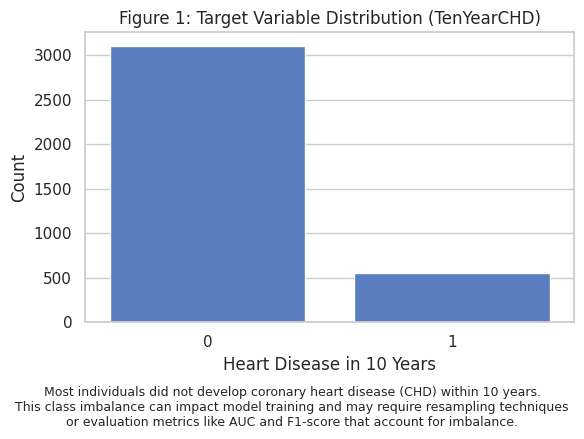

In [ ]:
sns.set(style="whitegrid", palette="muted")

# Plot for class balance
plt.figure(figsize=(6, 4))
sns.countplot(x='TenYearCHD', data=data)
plt.title("Figure 1: Target Variable Distribution (TenYearCHD)")
plt.xlabel("Heart Disease in 10 Years")
plt.ylabel("Count")
plt.figtext(
    0.5, -0.08,
    "Most individuals did not develop coronary heart disease (CHD) within 10 years.\n"
    "This class imbalance can impact model training and may require resampling techniques\n"
    "or evaluation metrics like AUC and F1-score that account for imbalance.",
    wrap=True, horizontalalignment='center', fontsize=9
)
plt.tight_layout()
plt.show()

This plot displays the class distribution of the target variable TenYearCHD.

We use a bar chart to show how many individuals developed coronary heart disease (CHD) over a 10-year period (value = 1) versus those who did not (value = 0).
Since the dataset is imbalanced — with fewer positive cases — we also annotate each bar with its respective percentage.
This is an essential step in EDA because it shows that only around 15% of patients had CHD, which justifies the use of metrics like Recall and F1 Score instead of Accuracy alone.

This imbalance in the target variable may pose a problem for model evaluation: a classifier may achieve high overall accuracy while exhibiting very low recall on the minority class.

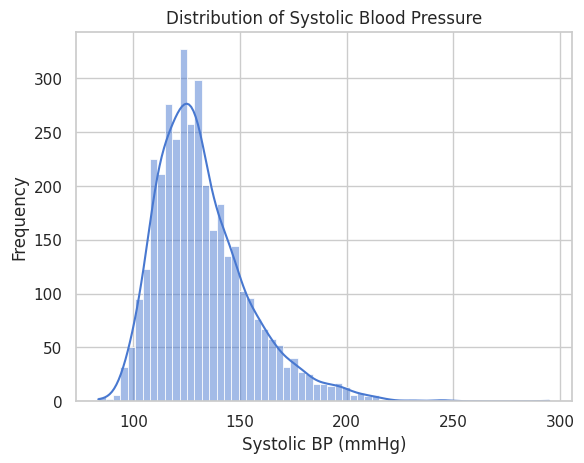

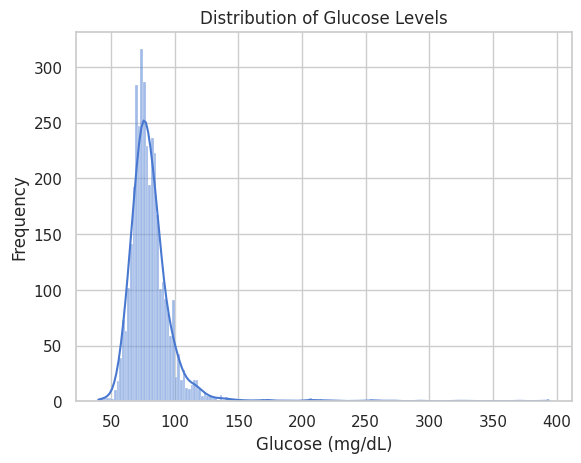

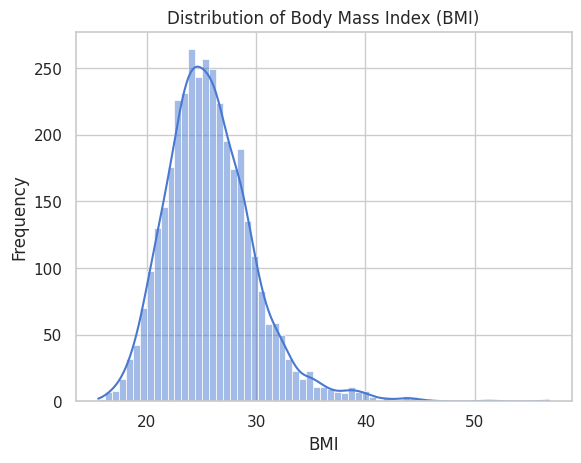

In [ ]:
#Univariate Analysis
# Distribution of systolic blood pressure (sysBP)
sns.histplot(data['sysBP'], kde=True)
plt.title('Distribution of Systolic Blood Pressure')
plt.xlabel('Systolic BP (mmHg)')
plt.ylabel('Frequency')
plt.show()

# Distribution of glucose levels
sns.histplot(data['glucose'], kde=True)
plt.title('Distribution of Glucose Levels')
plt.xlabel('Glucose (mg/dL)')
plt.ylabel('Frequency')
plt.show()

# Distribution of Body Mass Index (BMI)
sns.histplot(data['BMI'], kde=True)
plt.title('Distribution of Body Mass Index (BMI)')
plt.xlabel('BMI')
plt.ylabel('Frequency')
plt.show()

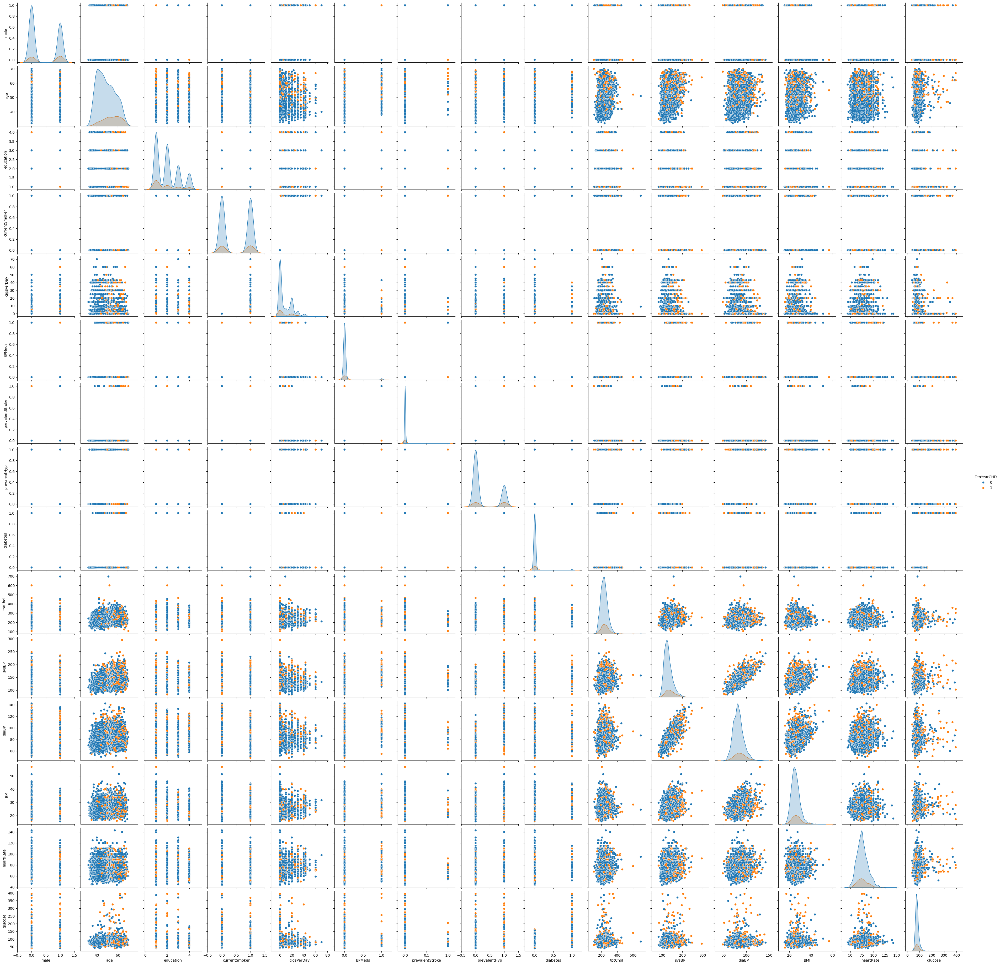

In [ ]:
sns.pairplot(data, hue='TenYearCHD')

**Histograms**

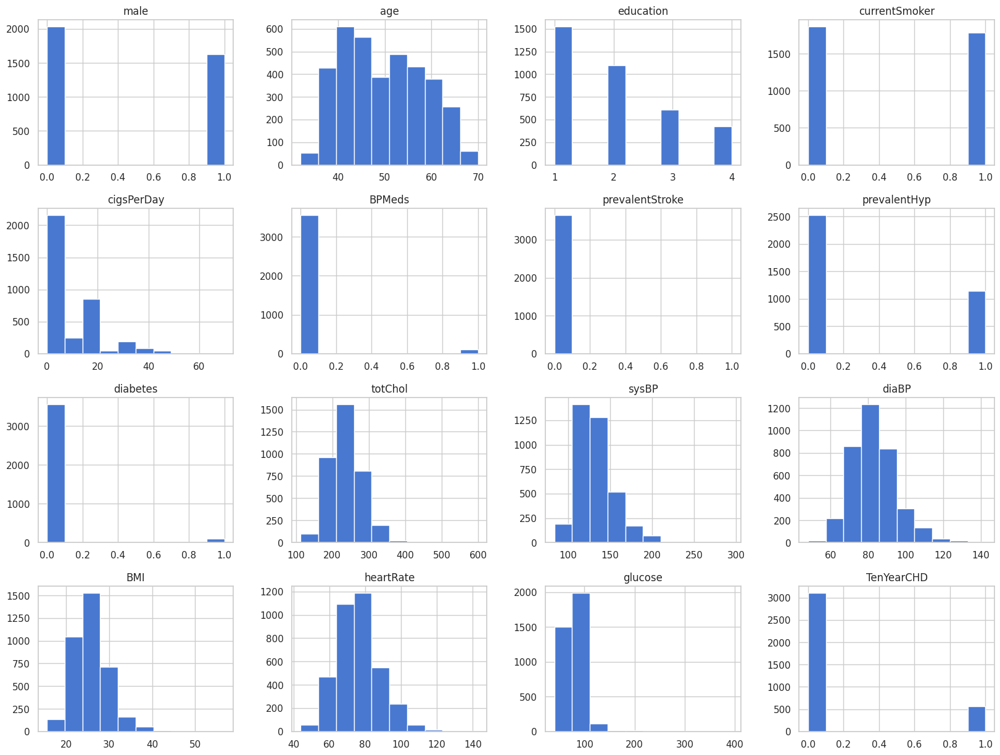

In [ ]:
data.hist(figsize=(20,15))
plt.show()

cigsPerDay: Most values are concentrated at the lower end (0-10), but there's a long tail extending to higher values, suggesting some individuals smoke a very high number of cigarettes per day. These higher values could be considered outliers depending on the definition.



Let's analyze correlations among features

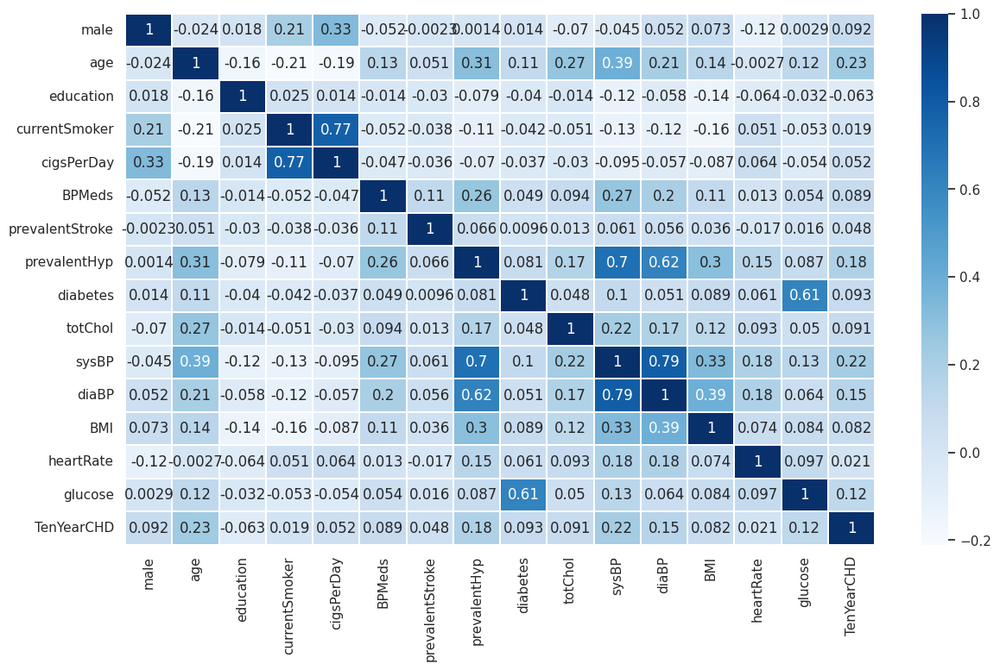

In [ ]:
corr_matrix = data.corr()

plt.figure(figsize=(14,8))
sns.heatmap(corr_matrix, linewidths=.01, annot = True, cmap='Blues')
plt.show()

It displays Pearson correlation coefficients between each pair of features.

CHD correlation:


*   While no single feature is strongly correlated with CHD (TenYearCHD), multiple variables such as age (0.23), systolic blood pressure (0.22), and hypertension status (0.18) show moderate positive associations.
*   We will try to find feature engineered features that can be more predictive for our target.






In [ ]:
corr_matrix['TenYearCHD'].sort_values(ascending=False)

,TenYearCHD
TenYearCHD,1.000000
age,0.233983
sysBP,0.222821
prevalentHyp,0.181387
diaBP,0.150124
glucose,0.121990
diabetes,0.093431
male,0.091688
totChol,0.091338
BPMeds,0.089152


# Train and Test

Now we proced with the division into training and test sets.

We allocated 80% of the data to the training set and 20% to the test set, using a random_state of 42 to ensure reproducibility.

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
train_set, test_set = train_test_split(data, test_size=0.2, random_state=42)
print('Training data:', train_set.shape)
print('Test data: ', test_set.shape)

Training data: (2926, 16)
Test data:  (732, 16)


- 2,926 samples for training
- 732 for testing
- each with 16 features.

**Limitation:**
- Imbalanced target (TenYearCHD):  risk of underrepresent it.
- We address this problem with the K-Fold Cross-Validation

In [ ]:
train_set_COPY = train_set.copy()
test_set_COPY = test_set.copy()

In [ ]:
data = train_set_COPY.drop(['TenYearCHD'], axis=1)
data_test = test_set_COPY.drop(['TenYearCHD'], axis=1)
target = train_set_COPY['TenYearCHD']


In [ ]:
from sklearn.model_selection import cross_val_score, StratifiedKFold
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier

models = {
    "Logistic Regression": LogisticRegression(class_weight='balanced', max_iter=1000),
    "Decision Tree": DecisionTreeClassifier(),
    "Random Forest": RandomForestClassifier(),
    "KNN": KNeighborsClassifier(),
    "SVM": SVC(class_weight='balanced')  # or use probability=True if needed
}

metrics = ['f1', 'recall', 'precision', 'accuracy', 'roc_auc']
kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

for name, model in models.items():
    print(f"--- {name} ---")
    for metric in metrics:
        scores = cross_val_score(model, data, target, cv=kfold, scoring=metric)
        print(f"{metric.upper()}: {scores.mean():.4f} ± {scores.std():.4f}")
    print()


--- Logistic Regression ---
F1: 0.3800 ± 0.0338
RECALL: 0.6736 ± 0.0673
PRECISION: 0.2647 ± 0.0226
ACCURACY: 0.6736 ± 0.0157
ROC_AUC: 0.7283 ± 0.0378

--- Decision Tree ---
F1: 0.2619 ± 0.0442
RECALL: 0.2690 ± 0.0491
PRECISION: 0.2497 ± 0.0556
ACCURACY: 0.7662 ± 0.0166
ROC_AUC: 0.5618 ± 0.0204

--- Random Forest ---
F1: 0.0867 ± 0.0232
RECALL: 0.0506 ± 0.0237
PRECISION: 0.4862 ± 0.1547
ACCURACY: 0.8534 ± 0.0040
ROC_AUC: 0.6939 ± 0.0346

--- KNN ---
F1: 0.1109 ± 0.0431
RECALL: 0.0713 ± 0.0303
PRECISION: 0.2616 ± 0.0724
ACCURACY: 0.8336 ± 0.0037
ROC_AUC: 0.5985 ± 0.0309

--- SVM ---
F1: 0.3621 ± 0.0311
RECALL: 0.6345 ± 0.0635
PRECISION: 0.2534 ± 0.0206
ACCURACY: 0.6682 ± 0.0136
ROC_AUC: 0.7235 ± 0.0373



- Logistics Regression and SVM outperform other models for:
  - Recall
  - F1-score
  - good robustness
    - how consistent and reliable a model’s performance is across different data splits or scenarios.
- Random Forest and KNN:
  - higher accuracy
  - low recall
    - they fail to detect positive cases
    - unacceptable in a medical setting

In [ ]:
data = train_set_COPY.drop(['TenYearCHD'], axis=1)
data_test = test_set_COPY.drop(['TenYearCHD'], axis=1)

# Preserve a copy of data for PCA

- Ensure a safe workflow feature engineering and transformation

In [ ]:
train_set_COPY = train_set.copy()
test_set_COPY = test_set.copy()

## Label Separation and Feature Standardization

- When applying transformations we should only apply them to the input features, not the target.

In [ ]:
data = train_set.copy()

In [ ]:
data_labels = train_set['TenYearCHD'].copy()

In [ ]:
data_labels.head()

,TenYearCHD
3934,0
392,0
1838,0
1852,0
780,0


In [ ]:
data = data.drop('TenYearCHD', axis=1)

In [ ]:
data.head()

,male,age,education,currentSmoker,cigsPerDay,BPMeds,prevalentStroke,prevalentHyp,diabetes,totChol,sysBP,diaBP,BMI,heartRate,glucose
3934,1,40,1.0,1,20.0,0.0,0,0,0,191.0,130.5,63.0,23.92,79.0,66.0
392,0,48,3.0,0,0.0,0.0,0,0,0,310.0,124.0,74.0,25.94,70.0,73.0
1838,1,44,1.0,1,40.0,0.0,0,1,0,201.0,142.5,104.5,34.59,67.0,67.0
1852,0,50,3.0,0,0.0,0.0,0,0,0,229.0,105.0,72.5,26.25,90.0,79.0
780,0,46,3.0,1,20.0,0.0,0,0,0,253.0,118.0,82.0,19.70,100.0,70.0


- Now we apply a standardization transformation using:
  - Scikit-learn's Pipeline
     - consistency
      - all transformations are applied in the same order every time, reducing the risk of errors.
     - **clean** and **consistent** preprocessing workflow
  - ColumnTransformer tools
    - Critical models like KNN or SVM
      - ensures that all features contribute equally
    - Improves model interpretability
    - Useful for when we will aplly PCA

In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.compose import ColumnTransformer

In [ ]:
num_pipeline = Pipeline([
        ('std_scaler', StandardScaler()),
    ])

In [ ]:
num_attributes = list(data.columns)
transform_pipeline = ColumnTransformer([
        ("num", num_pipeline, num_attributes),
    ])

In [ ]:
data_prepared = transform_pipeline.fit_transform(train_set)

In [ ]:
data_prepared

array([[ 1.09544512, -1.11664271, -0.95683173, ..., -0.45600546,
         0.27825523, -0.69214514],
       [-0.91287093, -0.18135905,  1.00030888, ...,  0.0374076 ,
        -0.47693113, -0.38086752],
       [ 1.09544512, -0.64900088, -0.95683173, ...,  2.15029029,
        -0.72865992, -0.64767691],
       ...,
       [ 1.09544512, -0.2982695 ,  1.97887919, ...,  0.59677192,
        -2.32294224, -0.24746282],
       [ 1.09544512,  0.40319324,  0.02173857, ...,  0.47952525,
        -0.72865992,  0.99764767],
       [ 1.09544512,  0.05246187,  0.02173857, ...,  1.24651388,
        -1.31602709, -0.55874044]])

In [ ]:
data_prepared.shape

(2926, 15)

In [ ]:
data.shape

(2926, 15)

In [ ]:
data_labels.shape

(2926,)

# Training

**5 classification algorithms:**
- Logistic regression
- Support Vector Machines (SVM)
- Decision Tree
- Random Forest
- KNeighborsClassifier (KNN)

We can have a diverse range of learning strategies.

**Metrics for evaluation:**
- Accuracy
- Precision
- Recall
- F1

Useful to capture different performance aspects.

**Why These 5 Classification Algorithms?**

| **Algorithm**                    | **Reason**                                                           | **Use**                                                | **Rationale**                                                             |
| -------------------------------- | -------------------------------------------------------------------- | ------------------------------------------------------ | ------------------------------------------------------------------------- |
| **Logistic Regression**          | Simple, fast, interpretable                                          | Strong baseline for binary classification problems     | Assumes approximately linear relationship between inputs and target       |
| **Support Vector Machine (SVM)** | Powerful for both linear and non-linear classification using kernels | Effective in high-dimensional spaces                   | Works well when classes are separable with a margin                       |
| **Decision Tree**                | Interpretable model that can capture non-linear patterns             | Handles both numerical and categorical data well       | Useful for modeling feature interactions and conditional decisions        |
| **Random Forest**                | Ensemble of decision trees, more robust and generalizable            | Reduces overfitting compared to a single decision tree | Provides better accuracy and handles noisy data effectively               |
| **K-Nearest Neighbors (KNN)**    | Simple, instance-based learning                                      | No training phase; decision based on distance          | Good non-parametric baseline; useful for exploring local patterns in data |


**Why These 5 Evaluation Metrics?**

Each metric captures a different aspect of model performance. Depending on the use case, one may matter more than the others.

| Metric        | What It Measures                     | Why It's Important                                                                                       |
| ------------- | ------------------------------------ | -------------------------------------------------------------------------------------------------------- |
| **Accuracy**  | Overall correctness                  | Good for **balanced datasets**. Tells you how often the model is right.                                  |
| **Precision** | Correctness of positive predictions  | Important when **false positives are costly** (e.g., spam detection).                                    |
| **Recall**    | Ability to find all positives        | Critical when **false negatives are dangerous** (e.g., cancer detection).                                |
| **F1 Score**  | Balance between precision and recall | Good for **imbalanced classes**. Avoids misleading results when accuracy is high but recall is low.      |
| **ROC AUC**   | Overall ability to rank predictions  | Useful for **imbalanced datasets**. Measures how well the model separates classes across all thresholds. |








In [ ]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score

In [ ]:
def evaluate_on_metrics(true_labels, predictions):
    accuracy = accuracy_score(true_labels, predictions)
    precision = precision_score(true_labels, predictions)
    recall = recall_score(true_labels, predictions)
    f1 = f1_score(true_labels, predictions)
    roc_auc = roc_auc_score(true_labels, predictions)

    return accuracy, precision, recall, f1, roc_auc

## Logistic regression

In [ ]:
from sklearn.linear_model import LogisticRegression

In [ ]:
log_reg = LogisticRegression()
log_reg.fit(data_prepared, data_labels)

LogisticRegression()

In [ ]:
log_predictions = log_reg.predict(data_prepared)

In [ ]:
log_accuracy, log_precision, log_recall, log_f1, log_roc_auc = evaluate_on_metrics(data_labels, log_predictions)

print('LOGISTIC REGRESSION PERFORMANCE ON TRAINING DATASET')
print('Accuracy: ', log_accuracy,'\nPrecision: ', log_precision, '\nRecall: ', log_recall, '\nF1 score: ', log_f1, '\nROC_AUC: ', log_roc_auc)

LOGISTIC REGRESSION PERFORMANCE ON TRAINING DATASET
Accuracy:  0.8571428571428571 
Precision:  0.6808510638297872 
Recall:  0.0735632183908046 
F1 score:  0.13278008298755187 
ROC_AUC:  0.5337707701749286


In [ ]:
print ("Confusion matrix:")
print (confusion_matrix(data_labels, log_predictions))

Confusion matrix:
[[2476   15]
 [ 403   32]]


## SVM

In [ ]:
from sklearn.svm import SVC

In [ ]:
svm = SVC(gamma='scale')
svm.fit(data_prepared, data_labels)

SVC()

In [ ]:
svm_predictions = svm.predict(data_prepared)

In [ ]:
svm_accuracy, svm_precision, svm_recall, svm_f1, svm_roc_auc = evaluate_on_metrics(data_labels, svm_predictions)

print('SVM PERFORMANCE ON TRAINING DATASED')
print('Accuracy: ', svm_accuracy,'\nPrecision: ', svm_precision, '\nRecall: ', svm_recall, '\nF1 score: ', svm_f1, '\nROC_AUC: ', svm_roc_auc)

SVM PERFORMANCE ON TRAINING DATASED
Accuracy:  0.8632946001367054 
Precision:  1.0 
Recall:  0.08045977011494253 
F1 score:  0.14893617021276595 
ROC_AUC:  0.5402298850574713


In [ ]:
print ("Confusion matrix:")
print (confusion_matrix(data_labels, svm_predictions))

Confusion matrix:
[[2491    0]
 [ 400   35]]


## Decision Tree Classifier

In [ ]:
from sklearn.tree import DecisionTreeClassifier

In [ ]:
tree_class = DecisionTreeClassifier(random_state=42)
tree_class.fit(data_prepared, data_labels)

DecisionTreeClassifier(random_state=42)

In [ ]:
tree_class_predictions = tree_class.predict(data_prepared)

In [ ]:
tree_class_accuracy, tree_class_precision, tree_class_recall, tree_class_f1, tree_class_roc_auc = evaluate_on_metrics(data_labels, tree_class_predictions)

print('DECISION TREE PERFORMANCE ON TRAINING DATASET')
print('Accuracy: ', tree_class_accuracy,'\nPrecision: ', tree_class_precision, '\nRecall: ', tree_class_recall, '\nF1 score: ', tree_class_f1, '\nROC_AUC: ', tree_class_roc_auc)

DECISION TREE PERFORMANCE ON TRAINING DATASET
Accuracy:  1.0 
Precision:  1.0 
Recall:  1.0 
F1 score:  1.0 
ROC_AUC:  1.0


In [ ]:
print ("Confusion matrix:")
print (confusion_matrix(data_labels, tree_class_predictions))

Confusion matrix:
[[2491    0]
 [   0  435]]


Generate classification tree for Decision Tree Classifier:

In [ ]:
from sklearn.tree import export_graphviz

tree_g = export_graphviz(tree_class, out_file='tree.dot', rounded = True, proportion = False,
                precision = 2, filled = True)


In [ ]:
!dot -Tpng tree.dot -o tree.png

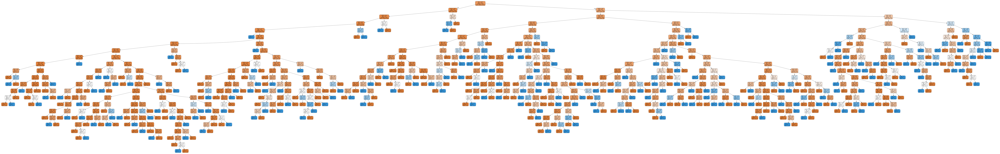

In [ ]:
plt.figure(figsize = (120, 130))
plt.imshow(plt.imread('tree.png'))
plt.axis('off')
plt.show()

In [ ]:
import graphviz
from sklearn.tree import export_graphviz
import matplotlib.pyplot as plt
import os

# Assuming tree_class is already trained
tree_g = export_graphviz(tree_class, out_file=None, rounded=True, proportion=False,
                         precision=2, filled=True, feature_names=data.columns, class_names=['No CHD', 'CHD']) # Added feature_names and class_names for better labels

graph = graphviz.Source(tree_g)

# Save to an SVG file
svg_file_path = 'tree.svg'
graph.render(svg_file_path, view=False, cleanup=True, format='svg')

print(f"Decision tree saved as {svg_file_path}")

Decision tree saved as tree.svg


- **graphviz**: provides a simple pure-Python interface for the Graphviz graph-drawing software


## Random Forest Classifier

In [ ]:
from sklearn.ensemble import RandomForestClassifier

In [ ]:
rf_class = RandomForestClassifier(random_state=42)
rf_class.fit(data_prepared, data_labels)

RandomForestClassifier(random_state=42)

In [ ]:
rf_class_predictions = rf_class.predict(data_prepared)

In [ ]:
rf_class_accuracy, rf_class_precision, rf_class_recall, rf_class_f1, rf_class_roc_auc = evaluate_on_metrics(data_labels, rf_class_predictions)

print('RANDOM FOREST PERFORMANCE ON TRAINING DATASET')
print('Accuracy: ', rf_class_accuracy,'\nPrecision: ', rf_class_precision, '\nRecall: ',rf_class_recall, '\nF1 score: ', rf_class_f1, '\nROC_AUC: ', rf_class_roc_auc)

RANDOM FOREST PERFORMANCE ON TRAINING DATASET
Accuracy:  1.0 
Precision:  1.0 
Recall:  1.0 
F1 score:  1.0 
ROC_AUC:  1.0


In [ ]:
print ("Confusion matrix:")
print (confusion_matrix(data_labels, rf_class_predictions))

Confusion matrix:
[[2491    0]
 [   0  435]]


## K-Nearest Neighbors

In [ ]:
from sklearn.neighbors import KNeighborsClassifier

In [ ]:
knn = KNeighborsClassifier(n_neighbors=3)
knn.fit(data_prepared, data_labels)

KNeighborsClassifier(n_neighbors=3)

In [ ]:
knn_predictions = knn.predict(data_prepared)

In [ ]:
knn_accuracy, knn_precision, knn_recall, knn_f1, knn_roc_auc = evaluate_on_metrics(data_labels, knn_predictions)

print('K-NEARESR NEIGHBORS PERFORMANCE ON TRAINING DATASED')
print('Accuracy: ', knn_accuracy,'\nPrecision: ', knn_precision, '\nRecall: ',knn_recall, '\nF1 score: ', knn_f1, '\nROC_AUC: ', knn_roc_auc)

K-NEARESR NEIGHBORS PERFORMANCE ON TRAINING DATASED
Accuracy:  0.893028024606972 
Precision:  0.7772727272727272 
Recall:  0.3931034482758621 
F1 score:  0.5221374045801527 
ROC_AUC:  0.6867163166710504


In [ ]:
print ("Confusion matrix:")
print (confusion_matrix(data_labels, knn_predictions))

Confusion matrix:
[[2442   49]
 [ 264  171]]


# Evaluation on TRAINING dataset

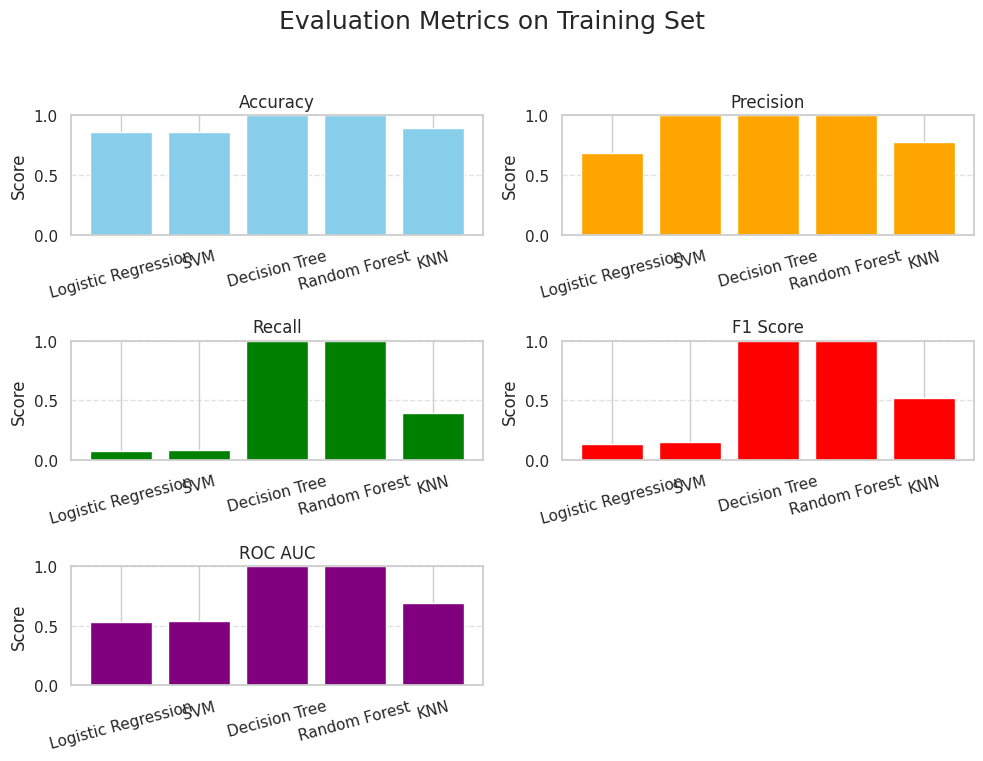

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Model names
models = ['Logistic Regression', 'SVM', 'Decision Tree', 'Random Forest', 'KNN']

# Metric values from evaluate_on_metrics()
accuracies = [log_accuracy, svm_accuracy, tree_class_accuracy, rf_class_accuracy, knn_accuracy]
precisions = [log_precision, svm_precision, tree_class_precision, rf_class_precision, knn_precision]
recalls = [log_recall, svm_recall, tree_class_recall, rf_class_recall, knn_recall]
f1_scores = [log_f1, svm_f1, tree_class_f1, rf_class_f1, knn_f1]
roc_aucs = [log_roc_auc, svm_roc_auc, tree_class_roc_auc, rf_class_roc_auc, knn_roc_auc]


# Set up 3x2 grid
fig, axs = plt.subplots(3, 2, figsize=(10, 8))
fig.suptitle('Evaluation Metrics on Training Set', fontsize=18)

# Plot Accuracy
axs[0, 0].bar(models, accuracies, color='skyblue')
axs[0, 0].set_title('Accuracy')
axs[0, 0].set_ylim(0, 1)
axs[0, 0].grid(axis='y', linestyle='--', alpha=0.6)

# Plot Precision
axs[0, 1].bar(models, precisions, color='orange')
axs[0, 1].set_title('Precision')
axs[0, 1].set_ylim(0, 1)
axs[0, 1].grid(axis='y', linestyle='--', alpha=0.6)

# Plot Recall
axs[1, 0].bar(models, recalls, color='green')
axs[1, 0].set_title('Recall')
axs[1, 0].set_ylim(0, 1)
axs[1, 0].grid(axis='y', linestyle='--', alpha=0.6)

# Plot F1 Score
axs[1, 1].bar(models, f1_scores, color='red')
axs[1, 1].set_title('F1 Score')
axs[1, 1].set_ylim(0, 1)
axs[1, 1].grid(axis='y', linestyle='--', alpha=0.6)

# Plot ROC AUC
axs[2, 0].bar(models, roc_aucs, color='purple')
axs[2, 0].set_title('ROC AUC')
axs[2, 0].set_ylim(0, 1)
axs[2, 0].grid(axis='y', linestyle='--', alpha=0.6)

# Leave last plot empty or use creatively
axs[2, 1].axis('off')  # empty plot

# Improve layout
for ax in axs.flat:
    if ax.get_visible():
        ax.set_xticklabels(models, rotation=15)
        ax.set_ylabel('Score')

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


- Decision Tree and Random Forest show near perfect scores across all metrics
  - overfitting
  - model has memorized the training data
    - no learnt general patterns.
- KNN shows decent performances (not perfect)
- Logistic Regression and SVM
  - they are conservative:
    - High precision
    - Low recall and F1
    - They’re good at avoiding FP, but they also miss a lot of TP

Accuracy:
- All models score high
- suggests those models fit the training data → overfitting
- Logistic Regression and SVM perform decently

Precision:
- we have very high precision
- is good only if paired with high recall. Alone, it’s misleading.

Recall:
- overfitting confirmation

F1 Score:
- Decision Tree and Random Forest
  - they perfectly balance precision and recall on training
  - Unrealistic.

ROC AUC:
- Decision Tree and Random Forest again hit 1.0
  - it is a problem with generalization

**CONFUSION METRIXS**

**True Negatives (TN)**
- Correctly predicted class 0 (negative)
  - model says “no disease” and it is right.

**False Positives (FP)**
- Incorrectly predicted class 1 when it was actually class 0
  - false alarm

**False Negatives (FN)**
- Incorrectly predicted class 0 when it was actually class 1
  - missed the positive case, which is more serious in medical settings

**True Positives (TP)**
- Correctly predicted class 1 (positive)
  - model says “yes, disease” and it is right


Logistic Regression:

|               | **Predicted: 0** | **Predicted: 1** |
| ------------- | ---------------- | ---------------- |
| **Actual: 0** | 2476 (**TN**)    | 15 (**FP**)      |
| **Actual: 1** | 403 (**FN**)     | 32 (**TP**)      |

SVM:

|               | **Predicted: 0** | **Predicted: 1** |
| ------------- | ---------------- | ---------------- |
| **Actual: 0** | 2491 (**TN**)    | 0 (**FP**)       |
| **Actual: 1** | 400 (**FN**)     | 35 (**TP**)      |

Decision Tree Classifier:

|               | **Predicted: 0** | **Predicted: 1** |
| ------------- | ---------------- | ---------------- |
| **Actual: 0** | 2491 (**TN**)    | 0 (**FP**)       |
| **Actual: 1** | 0 (**FN**)     | 435 (**TP**)       |

Random Forest:

|               | **Predicted: 0** | **Predicted: 1** |
| ------------- | ---------------- | ---------------- |
| **Actual: 0** | 2491 (**TN**)    | 0 (**FP**)       |
| **Actual: 1** | 0 (**FN**)     | 435 (**TP**)       |

KNN:

|               | **Predicted: 0** | **Predicted: 1** |
| ------------- | ---------------- | ---------------- |
| **Actual: 0** | 2442 (**TN**)    | 49 (**FP**)      |
| **Actual: 1** | 264 (**FN**)     | 171 (**TP**)      |




- Linear models (Logistic Regression, SVM) are very conservative
- They achieve high specificity
- but failing to detect most positive cases
  - critical aspect in medical context

- Tree-based models (Decision Tree, Random Forest) show perfect classification on training
- but are clearly overfitting
- likely to generalize poorly

- KNN shows the most reasonable behavior, but far from ideal

# Evaluation on TEST dataset

In [ ]:
data_test = test_set.copy()

In [ ]:
data_test.head()

,male,age,education,currentSmoker,cigsPerDay,BPMeds,prevalentStroke,prevalentHyp,diabetes,totChol,sysBP,diaBP,BMI,heartRate,glucose,TenYearCHD
362,0,48,4.0,0,0.0,0.0,0,0,0,200.0,118.0,78.0,24.53,63.0,98.0,0
1632,1,41,2.0,1,40.0,0.0,0,1,0,313.0,114.0,79.0,25.63,60.0,93.0,0
283,0,39,4.0,0,0.0,0.0,0,0,0,260.0,100.0,74.5,20.51,96.0,66.0,0
1325,0,36,3.0,0,0.0,0.0,0,0,0,230.0,112.5,73.5,22.36,63.0,65.0,0
2154,0,40,4.0,1,10.0,0.0,0,0,0,200.0,116.0,69.0,23.90,75.0,78.0,0


In [ ]:
data_test_labels = data_test['TenYearCHD'].copy()

In [ ]:
data_test = data_test.drop(['TenYearCHD'], axis=1)

In [ ]:
data_test.head()

,male,age,education,currentSmoker,cigsPerDay,BPMeds,prevalentStroke,prevalentHyp,diabetes,totChol,sysBP,diaBP,BMI,heartRate,glucose
362,0,48,4.0,0,0.0,0.0,0,0,0,200.0,118.0,78.0,24.53,63.0,98.0
1632,1,41,2.0,1,40.0,0.0,0,1,0,313.0,114.0,79.0,25.63,60.0,93.0
283,0,39,4.0,0,0.0,0.0,0,0,0,260.0,100.0,74.5,20.51,96.0,66.0
1325,0,36,3.0,0,0.0,0.0,0,0,0,230.0,112.5,73.5,22.36,63.0,65.0
2154,0,40,4.0,1,10.0,0.0,0,0,0,200.0,116.0,69.0,23.90,75.0,78.0


In [ ]:
data_test_labels.head()

,TenYearCHD
362,0
1632,0
283,0
1325,0
2154,0


In [ ]:
data_test_prepared = transform_pipeline.transform(data_test)

In [ ]:
data_test_prepared

array([[-0.91287093, -0.18135905,  1.97887919, ..., -0.30700449,
        -1.0642983 ,  0.73083828],
       [ 1.09544512, -0.99973225,  0.02173857, ..., -0.0383142 ,
        -1.31602709,  0.50849712],
       [-0.91287093, -1.23355317,  1.97887919, ..., -1.28894534,
         1.70471836, -0.69214514],
       ...,
       [-0.91287093,  1.22156645, -0.95683173, ..., -0.31921768,
        -0.05738315,  0.37509242],
       [ 1.09544512, -1.11664271,  1.00030888, ...,  1.41261333,
         1.87253755, -0.0695899 ],
       [ 1.09544512,  0.87083508, -0.95683173, ...,  0.44288567,
         1.03344159,  0.95317943]])

In [ ]:
data_test_prepared.shape

(732, 15)

## Prediction with Logistic Regression

In [ ]:
log_predictions = log_reg.predict(data_test_prepared)

In [ ]:
log_accuracy, log_precision, log_recall, log_f1, log_roc_auc = evaluate_on_metrics(data_test_labels, log_predictions)

print('LOGISTIC REGRESSION PERFORMANCE ON TEST DATASED')
print('Accuracy: ', log_accuracy,'\nPrecision: ', log_precision, '\nRecall: ', log_recall, '\nF1 score: ', log_f1, '\nROC_AUC: ', log_roc_auc)

LOGISTIC REGRESSION PERFORMANCE ON TEST DATASED
Accuracy:  0.8401639344262295 
Precision:  0.6923076923076923 
Recall:  0.07377049180327869 
F1 score:  0.13333333333333333 
ROC_AUC:  0.5336065573770491


In [ ]:
print ("Confusion matrix:")
print (confusion_matrix(data_test_labels, log_predictions))

Confusion matrix:
[[606   4]
 [113   9]]


## Prediction with SVM

In [ ]:
svm_predictions = svm.predict(data_test_prepared)

In [ ]:
svm_accuracy, svm_precision, svm_recall, svm_f1, svm_roc_auc = evaluate_on_metrics(data_test_labels, svm_predictions)

print('SVM PERFORMANCE ON TEST DATASET')
print('Accuracy: ', svm_accuracy,'\nPrecision: ', svm_precision, '\nRecall: ', svm_recall, '\nF1 score: ', svm_f1, '\nROC_AUC: ', svm_roc_auc)

SVM PERFORMANCE ON TEST DATASET
Accuracy:  0.8333333333333334 
Precision:  0.0 
Recall:  0.0 
F1 score:  0.0 
ROC_AUC:  0.5


In [ ]:
print ("Confusion matrix:")
print (confusion_matrix(data_test_labels, svm_predictions))

Confusion matrix:
[[610   0]
 [122   0]]


## Prediction with Decision Tree

In [ ]:
tree_class_predictions = tree_class.predict(data_test_prepared)

In [ ]:
tree_class_accuracy, tree_class_precision, tree_class_recall, tree_class_f1, tree_class_roc_auc = evaluate_on_metrics(data_test_labels, tree_class_predictions)

print('DECISION TREE PERFORMANCE ON TEST DATASET')
print('Accuracy: ', tree_class_accuracy,'\nPrecision: ', tree_class_precision, '\nRecall: ', tree_class_recall, '\nF1 score: ', tree_class_f1, '\nROC_AUC: ', tree_class_roc_auc)

DECISION TREE PERFORMANCE ON TEST DATASET
Accuracy:  0.7281420765027322 
Precision:  0.1968503937007874 
Recall:  0.20491803278688525 
F1 score:  0.20080321285140562 
ROC_AUC:  0.5188524590163934


In [ ]:
print ("Confusion matrix:")
print (confusion_matrix(data_test_labels, tree_class_predictions))

Confusion matrix:
[[508 102]
 [ 97  25]]


## Prediction with Random Forest

In [ ]:
rf_class_predictions = rf_class.predict(data_test_prepared)

In [ ]:
rf_class_accuracy, rf_class_precision, rf_class_recall, rf_class_f1, rf_class_roc_auc = evaluate_on_metrics(data_test_labels, rf_class_predictions)

print('RANDOM FOREST PERFORMANCE ON TEST DATASET')
print('Accuracy: ', rf_class_accuracy,'\nPrecision: ', rf_class_precision, '\nRecall: ',rf_class_recall, '\nF1 score: ', rf_class_f1, '\nROC_AUC: ', rf_class_roc_auc)

RANDOM FOREST PERFORMANCE ON TEST DATASET
Accuracy:  0.837431693989071 
Precision:  0.6666666666666666 
Recall:  0.04918032786885246 
F1 score:  0.0916030534351145 
ROC_AUC:  0.5221311475409836


In [ ]:
print ("Confusion matrix:")
print (confusion_matrix(data_test_labels, rf_class_predictions))

Confusion matrix:
[[607   3]
 [116   6]]


## Prediction with KNN

In [ ]:
knn_predictions = knn.predict(data_test_prepared)

In [ ]:
knn_accuracy, knn_precision, knn_recall, knn_f1, knn_roc_auc = evaluate_on_metrics(data_test_labels, knn_predictions)

print('K-NEAREST NEIGHBORS PERFORMANCE ON TEST DATASET')
print('Accuracy: ', knn_accuracy,'\nPrecision: ', knn_precision, '\nRecall: ',knn_recall, '\nF1 score: ', knn_f1, '\nROC_AUC: ', knn_roc_auc)

K-NEAREST NEIGHBORS PERFORMANCE ON TEST DATASET
Accuracy:  0.819672131147541 
Precision:  0.375 
Recall:  0.12295081967213115 
F1 score:  0.18518518518518517 
ROC_AUC:  0.5409836065573771


In [ ]:
print ("Confusion matrix:")
print (confusion_matrix(data_test_labels, knn_predictions))

Confusion matrix:
[[585  25]
 [107  15]]


# Overall evaluation

We learned how to use different ML classifier. Next we will use Python script to compare different classifiers.

In [ ]:
from sklearn.metrics import roc_curve
from sklearn import metrics

Create a dictionary of classifiers

In [ ]:
classifier_collection = {
    "Logistic Regression": LogisticRegression(),
    "SVM": SVC(gamma='scale'),
    "Decision Tree": DecisionTreeClassifier(random_state=42),
    "Random Forest": RandomForestClassifier(random_state=42),
    "Nearest Neighbors": KNeighborsClassifier(n_neighbors=3)
}

Dictionaries of scores

In [ ]:
accuracy_score_dict = {}
precision_score_dict = {}
recall_score_dict = {}
f1_score_dict = {}
roc_auc_dict = {}
confusion_matrix_dict = {}

Before we trained all models one by one, but now we'll train them all and obtain scores

In [ ]:
for classifier_model, classifier in (classifier_collection.items()):
    classifier.fit(data_prepared,data_labels)
    predicted = classifier.predict(data_test_prepared)
    accuracy_score_dict[classifier_model] = {'accuracy_score' :  accuracy_score(data_test_labels, predicted)}
    precision_score_dict[classifier_model] = {'precision_score' :  precision_score(data_test_labels, predicted)}
    recall_score_dict[classifier_model] = {'recall_score' :  recall_score(data_test_labels, predicted)}
    f1_score_dict[classifier_model] = {'f1_score' :  f1_score(data_test_labels, predicted)}
    confusion_matrix_dict[classifier_model] = {'matrix' : confusion_matrix(data_test_labels, predicted)}
    roc_auc_dict[classifier_model] = {'roc-auc' : metrics.roc_auc_score(data_test_labels, predicted)}

In [ ]:

models = list(accuracy_score_dict.keys())

print(f"{'Model':<20} {'Accuracy':<10} {'Precision':<10} {'Recall':<10} {'F1 Score':<10} {'ROC AUC':<10}")
print('-' * 70)
for model in models:
    print(f"{model:<20} "
          f"{accuracy_score_dict[model]['accuracy_score']:<10.4f} "
          f"{precision_score_dict[model]['precision_score']:<10.4f} "
          f"{recall_score_dict[model]['recall_score']:<10.4f} "
          f"{f1_score_dict[model]['f1_score']:<10.4f} "
          f"{roc_auc_dict[model]['roc-auc']:<10.4f}")

Model                Accuracy   Precision  Recall     F1 Score   ROC AUC   
----------------------------------------------------------------------
Logistic Regression  0.8402     0.6923     0.0738     0.1333     0.5336    
SVM                  0.8333     0.0000     0.0000     0.0000     0.5000    
Decision Tree        0.7281     0.1969     0.2049     0.2008     0.5189    
Random Forest        0.8374     0.6667     0.0492     0.0916     0.5221    
Nearest Neighbors    0.8197     0.3750     0.1230     0.1852     0.5410    


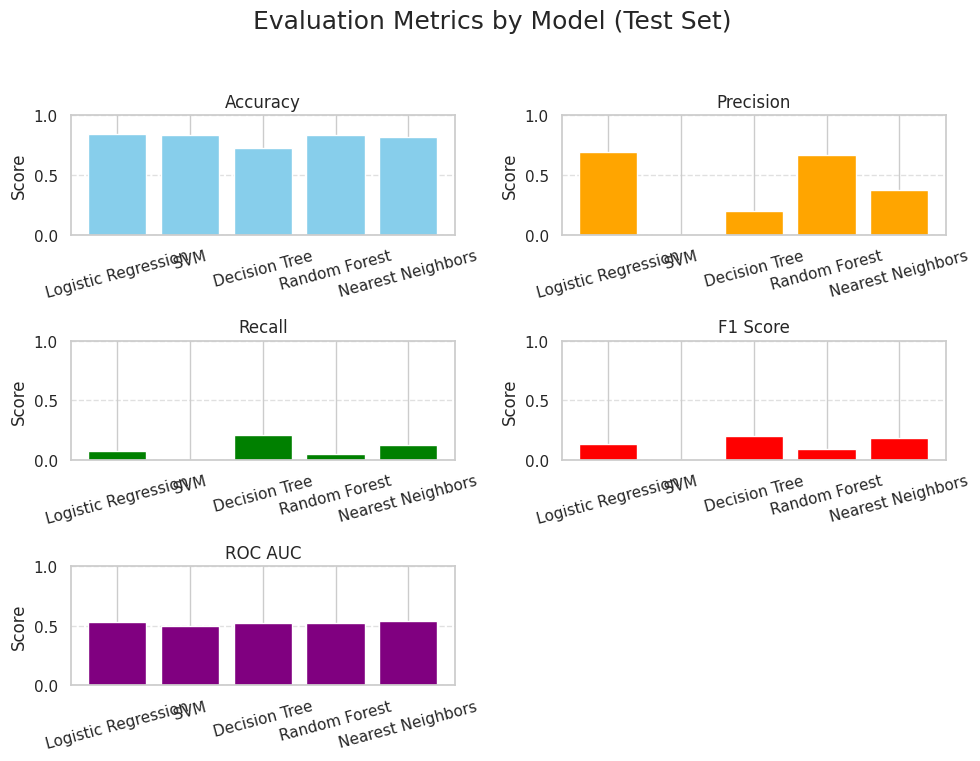

In [ ]:
# Correctly access the scalar value within the inner dictionary
accuracies = [accuracy_score_dict[m]['accuracy_score'] for m in models]
precisions = [precision_score_dict[m]['precision_score'] for m in models]
recalls = [recall_score_dict[m]['recall_score'] for m in models]
f1_scores = [f1_score_dict[m]['f1_score'] for m in models]
roc_aucs = [roc_auc_dict[m]['roc-auc'] for m in models]

# Set up 3x2 grid for metrics
fig, axs = plt.subplots(3, 2, figsize=(10, 8))
fig.suptitle('Evaluation Metrics by Model (Test Set)', fontsize=18)

# Plot Accuracy
axs[0, 0].bar(models, accuracies, color='skyblue')
axs[0, 0].set_title('Accuracy')
axs[0, 0].set_ylim(0, 1)
axs[0, 0].grid(axis='y', linestyle='--', alpha=0.6)

# Plot Precision
axs[0, 1].bar(models, precisions, color='orange')
axs[0, 1].set_title('Precision')
axs[0, 1].set_ylim(0, 1)
axs[0, 1].grid(axis='y', linestyle='--', alpha=0.6)

# Plot Recall
axs[1, 0].bar(models, recalls, color='green')
axs[1, 0].set_title('Recall')
axs[1, 0].set_ylim(0, 1)
axs[1, 0].grid(axis='y', linestyle='--', alpha=0.6)

# Plot F1 Score
axs[1, 1].bar(models, f1_scores, color='red')
axs[1, 1].set_title('F1 Score')
axs[1, 1].set_ylim(0, 1)
axs[1, 1].grid(axis='y', linestyle='--', alpha=0.6)

# Plot ROC AUC
axs[2, 0].bar(models, roc_aucs, color='purple')
axs[2, 0].set_title('ROC AUC')
axs[2, 0].set_ylim(0, 1)
axs[2, 0].grid(axis='y', linestyle='--', alpha=0.6)

# Leave last cell empty
axs[2, 1].axis('off')

# Improve layout
for ax in axs.flat:
    if ax.get_visible():
        ax.set_xticklabels(models, rotation=15)
        ax.set_ylabel('Score')

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

- All models show high accuracy but poor recall.
- Models models are generally failing to detect high-risk patients.
- The Decision Tree and KNN offer the most balanced performance.
  - highest recall and F1 scores
  - They catch more positives, even if at the cost of some precision.

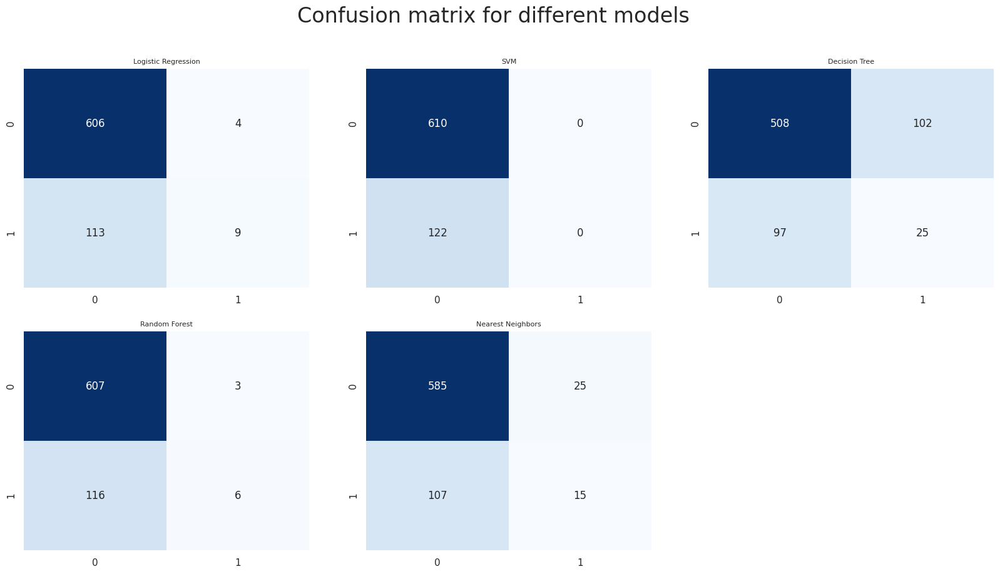

In [ ]:
plt.figure(figsize=(20,10))
plt.suptitle("Confusion matrix for different models",fontsize=24)

n = 0
for classifier, class_score in confusion_matrix_dict.items():
    for item, score in class_score.items():
        n +=1
        plt.subplot(2, 3, n)
        plt.title(classifier, fontsize=8)
        sns.heatmap(score,annot=True,cbar=False,cmap="Blues",fmt="d")


Logistic Regression:
- Very conservative: avoids false positives, but misses 113 true positives → recall ~7.4%
- consistent with previous results

SVM:
- it never detects any patient at risk
- This model is useless in medical diagnosis
- Matches prior finding

Decision Tree:
- Completely different from the training confusion matrix
  - 0 FN and 0 FP → perfect score
    - overfitting
- Now we see high number of FP and poor recall
- Overfitting confirmed

Random Forest:
- Similar performance
- Overfitting confirmed

KNN:
- Best balance among all models (still bad)
- less overfitting


# Comparison:
- Decision Tree and Random Forest perform perfectly on the training set. However, their performance drops dramatically on the test set, revealing severe overfitting.
- Logistic Regression and SVM, on the other hand, are much more stable: they perform consistently across both sets, but their recall remains low, making them overly conservative and prone to missing high-risk cases.
- KNN strikes the best compromise: while it doesn't perform perfectly on training, it shows more realistic generalization on the test set, with less overfitting and slightly better recall.

# PCA

**Why PCA?**

This has several advantages:
- It simplifies high-dimensional data making them easier to visualize and analyze

- It improves models performance:
  - It removes redundant or correlated features

- Noise reduction:
  - ignoring components that represent small or insignificant variation.

- Goals:
  - improving classification performance
  - improving computational efficiency

Now we'll conduct the same classification task mentioned above but after preprocessing data using PCA

In [ ]:
data_reduced = train_set_COPY.drop(['TenYearCHD'], axis=1)
data_test_reduced = test_set_COPY.drop(['TenYearCHD'], axis=1)

In [ ]:
from sklearn.decomposition import PCA

In [ ]:
pca = PCA(n_components=0.95)

data_reduced = pca.fit_transform(data_reduced)
data_test_reduced = pca.transform(data_test_reduced)

In [ ]:
data_test_reduced[0]

array([-38.39478817,   2.0347355 ,  20.24195208, -14.04382453,
        -3.33595538])

Model                Accuracy   Precision  Recall     F1 Score   ROC AUC   
----------------------------------------------------------------------
Logistic Regression  0.8388     0.7000     0.0574     0.1061     0.5262    
SVM                  0.8347     0.6667     0.0164     0.0320     0.5074    
Decision Tree        0.7760     0.3220     0.3115     0.3167     0.5902    
Random Forest        0.8361     0.5625     0.0738     0.1304     0.5311    
Nearest Neighbors    0.8224     0.4091     0.1475     0.2169     0.5525    


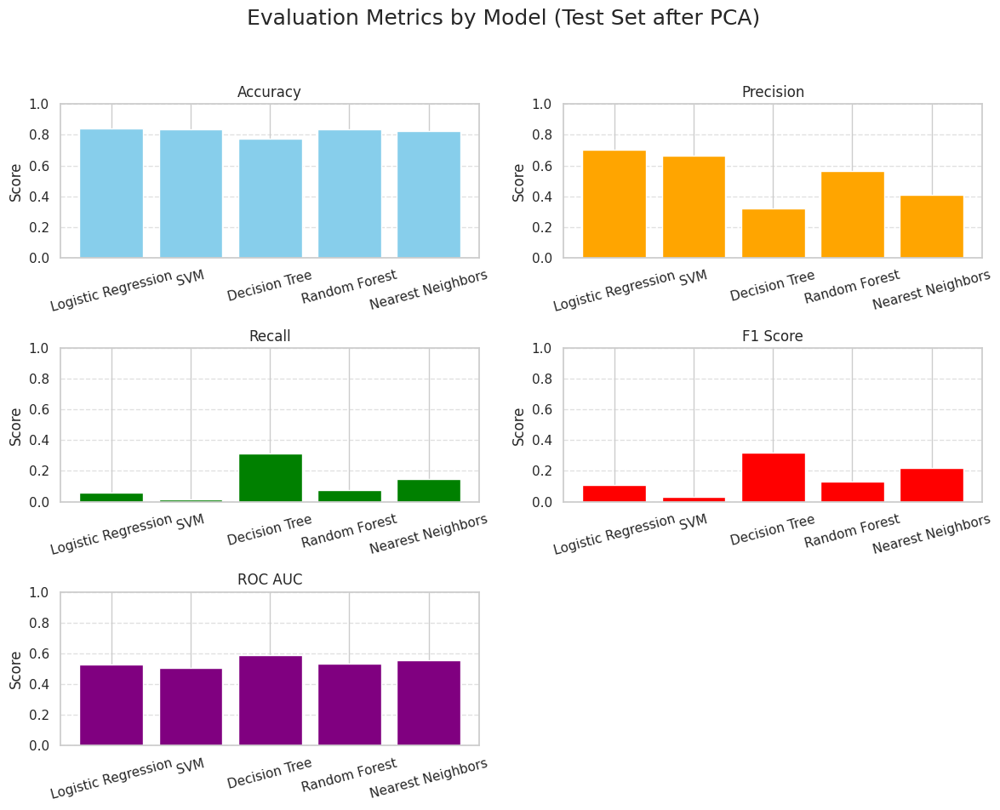

In [ ]:
# Create dictionaries for PCA results
accuracy_score_dict_PCA = {}
precision_score_dict_PCA = {}
recall_score_dict_PCA = {}
f1_score_dict_PCA = {}
roc_auc_score_dict_PCA = {}
confusion_matrix_dict_PCA = {}

# Assuming classifier_collection, data_reduced, data_test_reduced, and data_labels are defined from previous steps

for classifier_model, classifier in (classifier_collection.items()):
    # Retrain models on PCA transformed training data
    classifier.fit(data_reduced, data_labels)

    # Make predictions on PCA transformed test data
    predicted_PCA = classifier.predict(data_test_reduced)

    # Populate the dictionaries with results for PCA data
    accuracy_score_dict_PCA[classifier_model] = {'accuracy_score' :  accuracy_score(data_test_labels, predicted_PCA)}
    precision_score_dict_PCA[classifier_model] = {'precision_score' :  precision_score(data_test_labels, predicted_PCA)}
    recall_score_dict_PCA[classifier_model] = {'recall_score' :  recall_score(data_test_labels, predicted_PCA)}
    f1_score_dict_PCA[classifier_model] = {'f1_score' :  f1_score(data_test_labels, predicted_PCA)}
    # Ensure the key 'roc-auc' is used when populating the dictionary
    roc_auc_score_dict_PCA[classifier_model] = {'roc-auc' : metrics.roc_auc_score(data_test_labels, predicted_PCA)}
    confusion_matrix_dict_PCA[classifier_model] = {'matrix' : confusion_matrix(data_test_labels, predicted_PCA)}


# Extract metrics from each dict
models = list(accuracy_score_dict_PCA.keys()) # Use _PCA dictionary to get model names

print(f"{'Model':<20} {'Accuracy':<10} {'Precision':<10} {'Recall':<10} {'F1 Score':<10} {'ROC AUC':<10}")
print('-' * 70)
for model in models:
    print(f"{model:<20} "
          f"{accuracy_score_dict_PCA[model]['accuracy_score']:<10.4f} "
          f"{precision_score_dict_PCA[model]['precision_score']:<10.4f} "
          f"{recall_score_dict_PCA[model]['recall_score']:<10.4f} "
          f"{f1_score_dict_PCA[model]['f1_score']:<10.4f} "
          f"{roc_auc_score_dict_PCA[model]['roc-auc']:<10.4f}")

# Correctly access the scalar value within the inner dictionary
accuracies = [accuracy_score_dict_PCA[m]['accuracy_score'] for m in models]
precisions = [precision_score_dict_PCA[m]['precision_score'] for m in models]
recalls = [recall_score_dict_PCA[m]['recall_score'] for m in models]
f1_scores = [f1_score_dict_PCA[m]['f1_score'] for m in models]
# The key 'roc-auc' is used here, which matches the key used when populating the dictionary above
roc_aucs = [roc_auc_score_dict_PCA[m]['roc-auc'] for m in models]

# Set up 3x2 grid
fig, axs = plt.subplots(3, 2, figsize=(12, 10))
fig.suptitle('Evaluation Metrics by Model (Test Set after PCA)', fontsize=18)

# Accuracy
axs[0, 0].bar(models, accuracies, color='skyblue')
axs[0, 0].set_title('Accuracy')
axs[0, 0].set_ylim(0, 1)
axs[0, 0].grid(axis='y', linestyle='--', alpha=0.6)

# Precision
axs[0, 1].bar(models, precisions, color='orange')
axs[0, 1].set_title('Precision')
axs[0, 1].set_ylim(0, 1)
axs[0, 1].grid(axis='y', linestyle='--', alpha=0.6)

# Recall
axs[1, 0].bar(models, recalls, color='green')
axs[1, 0].set_title('Recall')
axs[1, 0].set_ylim(0, 1)
axs[1, 0].grid(axis='y', linestyle='--', alpha=0.6)

# F1 Score
axs[1, 1].bar(models, f1_scores, color='red')
axs[1, 1].set_title('F1 Score')
axs[1, 1].set_ylim(0, 1)
axs[1, 1].grid(axis='y', linestyle='--', alpha=0.6)

# ROC AUC
axs[2, 0].bar(models, roc_aucs, color='purple')
axs[2, 0].set_title('ROC AUC')
axs[2, 0].set_ylim(0, 1)
axs[2, 0].grid(axis='y', linestyle='--', alpha=0.6)

# Leave last cell empty
axs[2, 1].axis('off')

# Format all axes
for ax in axs.flat:
    if ax.get_visible():
        ax.set_xticklabels(models, rotation=15)
        ax.set_ylabel('Score')

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

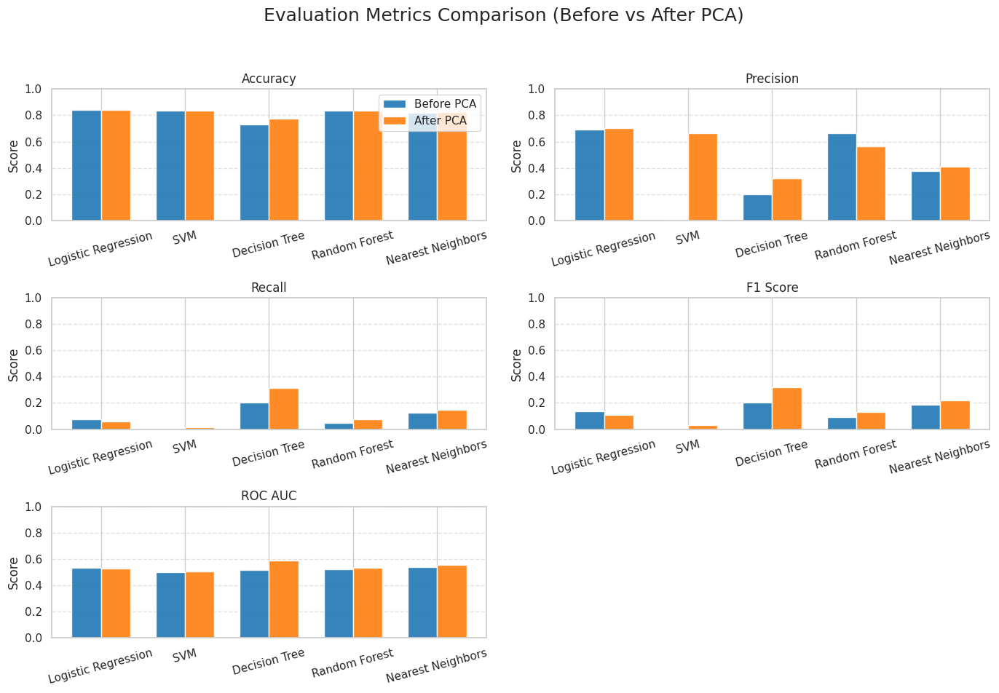

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Use consistent model ordering
models = list(accuracy_score_dict.keys())

# Extract metrics (before PCA)
acc_before = [accuracy_score_dict[m]['accuracy_score'] for m in models]
prec_before = [precision_score_dict[m]['precision_score'] for m in models]
rec_before = [recall_score_dict[m]['recall_score'] for m in models]
f1_before  = [f1_score_dict[m]['f1_score'] for m in models]
auc_before = [roc_auc_dict[m]['roc-auc'] for m in models]

# Extract metrics (after PCA)
acc_after = [accuracy_score_dict_PCA[m]['accuracy_score'] for m in models]
prec_after = [precision_score_dict_PCA[m]['precision_score'] for m in models]
rec_after = [recall_score_dict_PCA[m]['recall_score'] for m in models]
f1_after  = [f1_score_dict_PCA[m]['f1_score'] for m in models]
auc_after = [roc_auc_score_dict_PCA[m]['roc-auc'] for m in models]

# Plot settings
x = np.arange(len(models))
bar_width = 0.35

# Strong contrasting colors
color_before = '#1f77b4'
color_after = '#ff7f0e'

# Set up 3x2 grid
fig, axs = plt.subplots(3, 2, figsize=(14, 10))
fig.suptitle('Evaluation Metrics Comparison (Before vs After PCA)', fontsize=18)

# Helper function for each plot
def add_barplot(ax, metric_before, metric_after, title):
    ax.bar(x - bar_width/2, metric_before, width=bar_width, label='Before PCA', alpha=0.9, color=color_before)
    ax.bar(x + bar_width/2, metric_after, width=bar_width, label='After PCA', alpha=0.9, color=color_after)
    ax.set_title(title)
    ax.set_ylim(0, 1)
    ax.set_xticks(x)
    ax.set_xticklabels(models, rotation=15)
    ax.set_ylabel('Score')
    ax.grid(axis='y', linestyle='--', alpha=0.6)

# Plot each metric
add_barplot(axs[0, 0], acc_before, acc_after, 'Accuracy')
add_barplot(axs[0, 1], prec_before, prec_after, 'Precision')
add_barplot(axs[1, 0], rec_before, rec_after, 'Recall')
add_barplot(axs[1, 1], f1_before, f1_after, 'F1 Score')
add_barplot(axs[2, 0], auc_before, auc_after, 'ROC AUC')

# Leave last subplot blank
axs[2, 1].axis('off')

# Add legend only once
axs[0, 0].legend(loc='upper right')

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


**Accuracy**
- Still high for all models
  - Decision Tree performs slightly better after PCA
- PCA did little changes

**Recall**
- PCA slightly improved Decision Tree's and KNN’s ability to find positives

**F1 Score**
- Decision Tree has improved all the metrics
  - Suggests it learned generalizable structure in reduced PCA space

**Precision**
- Decision Tree and KNN sacrifice some precision to gain more recall
  - valuable in medical tasks
  

**ROC AUC**
- few models improved ranking ability

**SVM**
- It's normal that SVM improved after PCA.
The dimensionality reduction likely removed noise and improved class separability, helping the SVM detect a few positive cases it missed entirely before.
This confirms that SVM benefits from cleaner, de-correlated feature spaces made from PCA.


After applying PCA, overall model behavior remained similar, with high accuracy and poor recall across most models.
**Decision Tree improved** across all metrics after PCA. This suggests it was able to learn a more generalizable structure in the reduced feature space.
We decided to proceed with the results obtained without PCA.

# New proposed feature

The following engineered features were created to potentially improve the dataset's predictive power:

 **1) Blood Pressure-Age Ratio (bp_age_ratio)**

Captures how high blood pressure may indicate higher risk in younger individuals.

$$
\text{bp_age_ratio} = \frac{\text{sysBP}}{\text{age}}
$$



**2) Heart Stress Index (heart_stress_index)**

 - Combines resting heart rate and diastolic blood pressure to indicate how much stress the heart might be under at rest.

 - This feature reflects how hard the heart must work against vascular resistance, even in non-active conditions.

$$
\text{heart_stress_index} = \frac{\text{heartRate}}{1 + \text{diaBP}}
$$



**3) Cholesterol-Age Ratio (chol_age_ratio)**

 - Helps highlight individuals who may have **abnormally high** cholesterol for their age group.

 - This ratio captures situations where a patient's cholesterol level is unexpectedly high for their age, a potential early warning sign of cardiovascular risk.


 $$
\text{chol_age_ratio} = \frac{\text{totChol}}{\text{age}}
$$

**4) Binary Risk Feature for Young Individuals (young_risk)**

 - Flags young individuals (under 45 years old) who simultaneously present with:
  - High cholesterol (> 250 mg/dL)
  - High heart rate (> 85 bpm).

$$
\text{Young_risk} =
\begin{cases}
1 & \text{if } \text{age} < 45 \land \text{totChol} > 250 \land \text{heartRate} > 85 \\
0 & \text{otherwise}
\end{cases}
$$

**5) Heart Recovery Ratio (heart_recovery_ratio)**
 - Estimates how well the heart recovers at rest based on the relationship between heart rate and diastolic blood pressure.
 - High ratio: may suggest better cardiovascular recovery and efficiency
 - Higher value could indicate elevated resting stress or poor recovery.

 $$
\text{heart_recovery_ratio} = \frac{\text{heartRate}}{1 + \text{diaBP}}
$$

**6) The effect of education on cholesterol (chol_edu_ratio)**

- This feature estimates how **education** may relate to **cholesterol levels**.
- The hypothesis is that individuals with higher education may have better health awareness, dietary habits, and access to care — potentially resulting in lower cholesterol.

$$
\text{chol_edu_ratio} = \frac{\text{totChol}}{1 + \text{education}}
$$

**7) A combination of education, smoking, and BMI**

- Integrates **education level**, **smoking status**, and **body mass index (BMI)** to approximate a person's general lifestyle risk.
- Higher education tends to correlate with healthier behaviors, while smoking and high BMI are associated with increased cardiovascular risk.

$$
\text{lifestyle_index} = \text{education} - \text{currentSmoker} - \frac{\text{BMI}}{10}
$$

**Why These Features Are Useful**

 - **Domain-informed modeling**:
  - Each feature models real-world clinical hypotheses.
  - They introduce human-understandable structure into the data that black-box models may not automatically learn.

 - **Captures nonlinear relationships**:
  - These engineered variables can help simple models learn more complex patterns.

 - **Interpretability**:
  - By aligning with known medical relationships, these features support more explainable models
  - Unlike PCA or black-box feature selection, these variables can be used in explainable AI (XAI) tools (e.g., SHAP or LIME) and communicated to medical professionals.

 - **Better generalization**:
  - Helps prevent overfitting by embedding useful inductive biases into the data.


In [ ]:
data = train_set_COPY.drop(['TenYearCHD'], axis=1)
data_test = test_set_COPY.drop(['TenYearCHD'], axis=1)

In [ ]:
#Feature Engineering
def addNewFeatures(df):
    df["bp_age_ratio"] = df["sysBP"] / df["age"]

    df["heart_stress_index"] = df["heartRate"] / (1 + df["diaBP"])

    df["chol_age_ratio"] = df["totChol"] / df["age"]

    df["young_risk"] = ((df["age"] < 45) & (df["totChol"] > 250) & (df["heartRate"] > 85)).astype(int)

    df["heart_recovery_ratio"] = df["heartRate"] / (1 + df["diaBP"])

    df["chol_edu_ratio"] = df["totChol"] / (1 + df["education"])

    df["lifestyle_index"] = df["education"] - df["currentSmoker"] - df["BMI"] / 10

    return df

In [ ]:
data = addNewFeatures(data.copy()).copy()
data_test = addNewFeatures(data_test.copy()).copy()

**Next Steps and Future Work**

 Following the successful implementation and validation of the proposed feature engineering techniques, the project will proceed with the following key steps:

*   Preprocessing: Handle missing values, normalize data, and encode categorical variables.
*   Feature Engineering: Apply the new composite features listed above.
*   Model Selection: Evaluate multiple classifiers including Logistic Regression, SVM, Random Forest, and XGBoost.
*   Cross-Validation: Use Stratified K-Fold CV to ensure class balance during evaluation.
*   Performance Evaluation: Use metrics such as Accuracy, F1-Score, ROC-AUC.
*   Feature Importance Analysis: Identify the contribution of raw vs. engineered features to model performance.
*   Model Interpretability: Apply SHAP or LIME to ensure clinical explainability.
*   Final Deployment: Package the final model with a simple front-end for educational or clinical demo use.



In [ ]:
data.describe()

,male,age,education,currentSmoker,cigsPerDay,BPMeds,prevalentStroke,prevalentHyp,diabetes,totChol,...,BMI,heartRate,glucose,bp_age_ratio,heart_stress_index,chol_age_ratio,young_risk,heart_recovery_ratio,chol_edu_ratio,lifestyle_index
count,2926.000000,2926.000000,2926.000000,2926.000000,2926.000000,2926.000000,2926.000000,2926.000000,2926.000000,2926.000000,...,2926.000000,2926.000000,2926.000000,2926.000000,2926.000000,2926.000000,2926.000000,2926.000000,2926.000000,2926.000000
mean,0.454545,49.551265,1.977785,0.492139,9.152085,0.031442,0.006494,0.316815,0.026316,236.796651,...,25.786856,75.683869,81.564935,2.725422,0.915553,4.879231,0.015038,0.915553,88.632223,-1.093040
std,0.498015,8.555017,1.022074,0.500024,12.001956,0.174540,0.080334,0.465314,0.160100,43.896592,...,4.094633,11.919625,22.491808,0.501846,0.175312,1.053863,0.121723,0.175312,32.424250,1.222432
min,0.000000,32.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,113.000000,...,15.540000,45.000000,40.000000,1.439655,0.471698,1.878788,0.000000,0.471698,31.000000,-4.680000
25%,0.000000,42.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,205.250000,...,23.090000,67.000000,71.000000,2.362186,0.794393,4.163077,0.000000,0.794393,62.000000,-1.969500
50%,0.000000,49.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,234.000000,...,25.390000,75.000000,78.000000,2.684698,0.901254,4.769231,0.000000,0.901254,84.333333,-1.311000
75%,1.000000,56.000000,3.000000,1.000000,20.000000,0.000000,0.000000,1.000000,0.000000,264.000000,...,27.990000,82.000000,86.000000,3.047433,1.014493,5.520255,0.000000,1.014493,113.875000,-0.254000
max,1.000000,70.000000,4.000000,1.000000,60.000000,1.000000,1.000000,1.000000,1.000000,600.000000,...,56.800000,143.000000,394.000000,5.337838,1.721311,11.538462,1.000000,1.721311,216.000000,2.252000


In [ ]:
data_test.describe()

,male,age,education,currentSmoker,cigsPerDay,BPMeds,prevalentStroke,prevalentHyp,diabetes,totChol,...,BMI,heartRate,glucose,bp_age_ratio,heart_stress_index,chol_age_ratio,young_risk,heart_recovery_ratio,chol_edu_ratio,lifestyle_index
count,732.000000,732.000000,732.000000,732.000000,732.000000,732.000000,732.000000,732.000000,732.000000,732.000000,...,732.000000,732.000000,732.000000,732.000000,732.000000,732.000000,732.000000,732.000000,732.000000,732.000000
mean,0.400273,49.554645,1.990437,0.476776,8.519126,0.025956,0.002732,0.290984,0.030055,237.051913,...,25.766598,75.918033,83.004098,2.708585,0.921761,4.883126,0.015027,0.921761,88.326047,-1.062999
std,0.490289,8.595868,1.025618,0.499802,11.588990,0.159114,0.052235,0.454527,0.170854,44.922338,...,3.950118,12.232309,28.857094,0.486910,0.181101,1.066916,0.121745,0.181101,32.444210,1.203003
min,0.000000,34.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,133.000000,...,15.960000,44.000000,45.000000,1.468750,0.529183,2.555556,0.000000,0.529183,30.000000,-3.580000
25%,0.000000,42.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,208.000000,...,23.005000,68.000000,71.000000,2.394338,0.796965,4.165541,0.000000,0.796965,61.625000,-1.934250
50%,0.000000,49.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,232.500000,...,25.335000,75.000000,78.000000,2.703748,0.898156,4.790086,0.000000,0.898156,83.166667,-1.290000
75%,1.000000,56.000000,3.000000,1.000000,20.000000,0.000000,0.000000,1.000000,0.000000,261.250000,...,28.230000,84.000000,87.000000,3.038995,1.031621,5.477679,0.000000,1.031621,114.125000,-0.247500
max,1.000000,68.000000,4.000000,1.000000,70.000000,1.000000,1.000000,1.000000,1.000000,464.000000,...,45.800000,125.000000,394.000000,5.025641,1.785714,11.047619,1.000000,1.785714,205.000000,1.958000


# **Analyze the new training data**

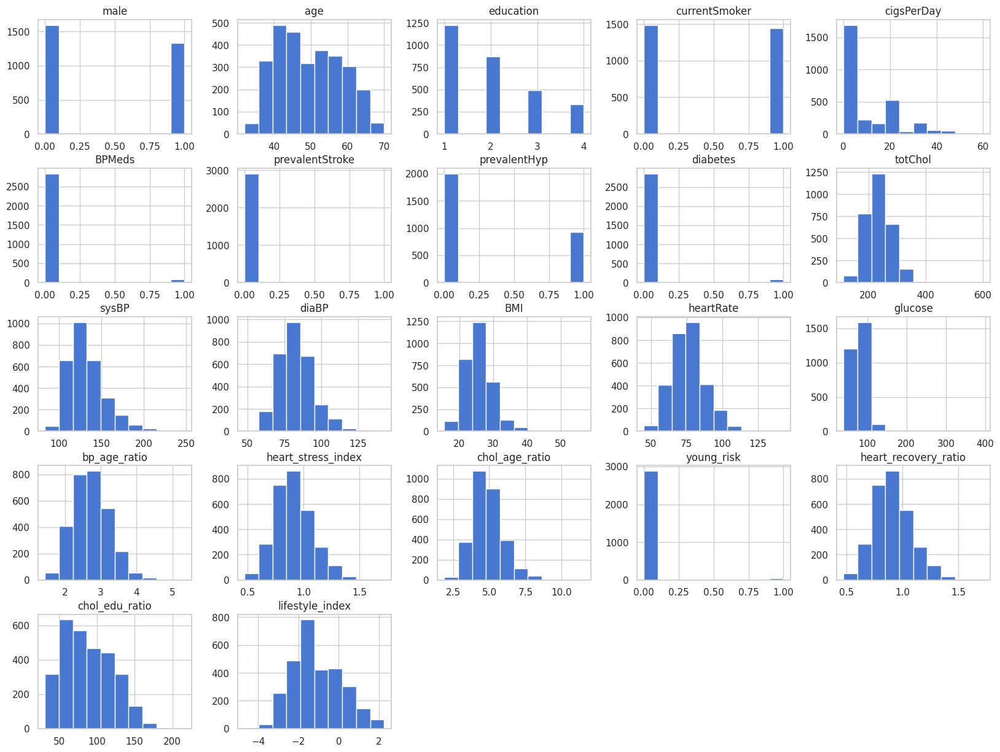

In [ ]:
data.hist(figsize=(20,15))
plt.show()

- bp_age_ratio:
  - Centered between 2.5 and 3.5
  - looks normally distributed

- heart_stress_index:
  - Values range from ~0.6 to 1.6

- chol_age_ratio:
  - between 2.5 and 7.5
  - moderate right skew

- young_risk:
  - binary variable
  - majority is 0 (non-flagged)
  - could be too specific
    - Overfitting risk

- heart_recovery_ratio:
  - centered around 1

- chol_edu_ratio:
  - slight right skew

- lifestyle_index:
  - ranges roughly from –5 to +2
  - centered near -2


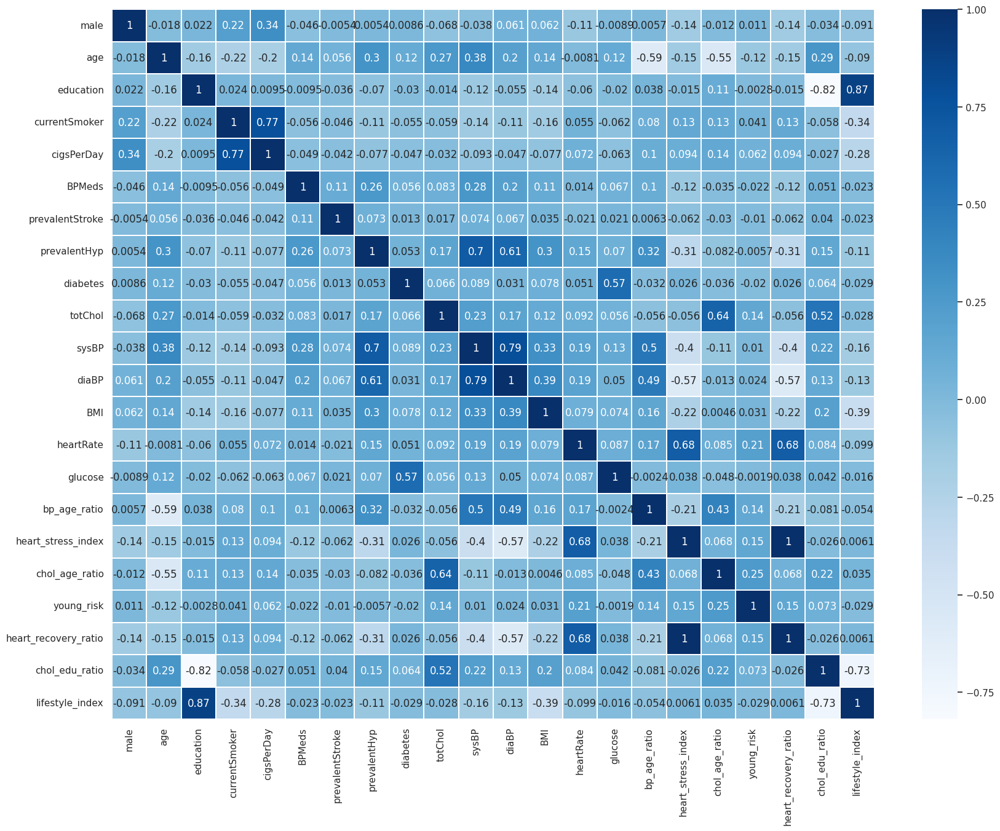

In [ ]:
corr_matrix = data.corr()

plt.figure(figsize=(20,15))
sns.heatmap(corr_matrix, linewidths=.01, annot = True, cmap='Blues')
plt.show()

Now we focus on engineered features and their relationship with existing ones.

bp_age_ratio:
- Expected (no new info):
  - sysBP: +0.5, but it is the numerator.
  - age: -0.59, but being the denominator is normal that as the age increases, the ratio decreases

- Not expected:

  - diaBP: +0.49
    - may appen because systolic and diastolic BP are themselves strongly correlated
    - **Implication**: bp_age_ratio captures not just systolic pressure, but general blood pressure trends

  - prevalentHyp: +0.32
    - higher values of bp_age_ratio are more common among hypertensive patients
    - This validates the idea that bp_age_ratio is a proxy for risk, even among patients not yet officially diagnosed.

  - chol_age_ratio: +0.43
    - Moderate correlation caused by the shared denominator (age)
    - But their numerators (totChol vs. sysBP) are medically unrelated
    - They carry different clinical meanings

  - heart_stress_index: –0.21
    - High systolic BP (raising bp_age_ratio) often occurs alongside low diastolic BP (which increases heart_stress_index)
    - Suggests that as systolic increases faster than diastolic, the heart is under greater pressure, but possibly less recovery.
    - clinically meaningful inverse, not redundancy


lifestyle_index:
  - strogn correlation with education (+0.87):
    - Education level is influence a lot the the index
  - Negative correlation currentSmoker (–0.28) and BMI (–0.39):
    - being a smoker or having higher BMI lowers the index
  - High negative correlation with chol_edu_ratio (–0.73):
    - Both features encode health–socioeconomic relationships, but in opposite directions

***Analyze the new test data***

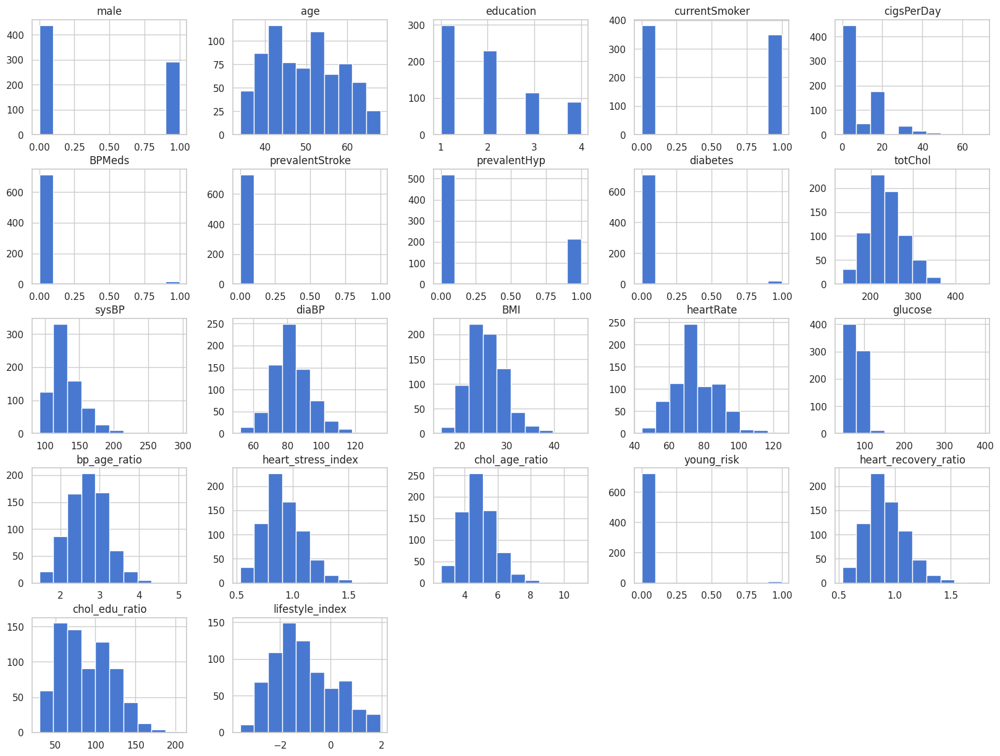

In [ ]:
data_test.hist(figsize=(20,15))
plt.show()

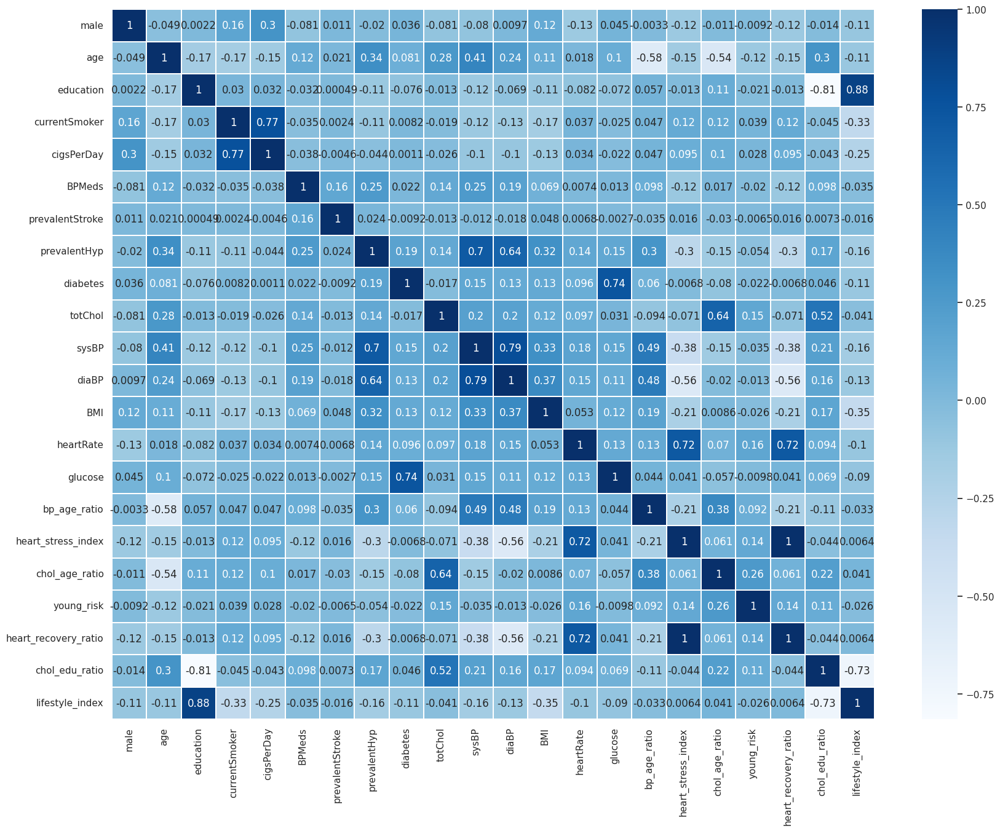

In [ ]:
corr_matrix = data_test.corr()

plt.figure(figsize=(20, 15))
sns.heatmap(corr_matrix, linewidths=.01, annot = True, cmap='Blues')
plt.show()

***Classification***

In [ ]:
accuracy_score_dict_proposed = {}
f1_score_dict_proposed  = {}
precison_score_dict_proposed = {}
recall_score_dict_proposed = {}
roc_auc_dict_proposed ={}

In [ ]:
for classifier_model, classifier in (classifier_collection.items()):
    classifier.fit(data, data_labels)
    predicted = classifier.predict(data_test)
    accuracy_score_dict_proposed [classifier_model] = {'accuracy_score' :  accuracy_score(data_test_labels, predicted)}
    f1_score_dict_proposed [classifier_model] = {'f1_score' :  f1_score(data_test_labels, predicted)}
    precison_score_dict_proposed [classifier_model] = {'precision_score' :  precision_score(data_test_labels, predicted)}
    recall_score_dict_proposed [classifier_model] = {'recall_score' :  recall_score(data_test_labels, predicted)}
    roc_auc_dict_proposed[classifier_model] = {'roc_auc_score': metrics.roc_auc_score(data_test_labels, predicted)}

In [ ]:
accuracy_score_dict

{'Logistic Regression': {'accuracy_score': 0.8401639344262295},
 'SVM': {'accuracy_score': 0.8333333333333334},
 'Decision Tree': {'accuracy_score': 0.7281420765027322},
 'Random Forest': {'accuracy_score': 0.837431693989071},
 'Nearest Neighbors': {'accuracy_score': 0.819672131147541}}

In [ ]:
accuracy_score_dict_proposed

{'Logistic Regression': {'accuracy_score': 0.8415300546448088},
 'SVM': {'accuracy_score': 0.8333333333333334},
 'Decision Tree': {'accuracy_score': 0.7745901639344263},
 'Random Forest': {'accuracy_score': 0.837431693989071},
 'Nearest Neighbors': {'accuracy_score': 0.8183060109289617}}

In [ ]:
f1_score_dict

{'Logistic Regression': {'f1_score': 0.13333333333333333},
 'SVM': {'f1_score': 0.0},
 'Decision Tree': {'f1_score': 0.20080321285140562},
 'Random Forest': {'f1_score': 0.0916030534351145},
 'Nearest Neighbors': {'f1_score': 0.18518518518518517}}

In [ ]:
f1_score_dict_proposed

{'Logistic Regression': {'f1_score': 0.13432835820895522},
 'SVM': {'f1_score': 0.0},
 'Decision Tree': {'f1_score': 0.2794759825327511},
 'Random Forest': {'f1_score': 0.11851851851851852},
 'Nearest Neighbors': {'f1_score': 0.17391304347826086}}

In [ ]:
precision_score_dict

{'Logistic Regression': {'precision_score': 0.6923076923076923},
 'SVM': {'precision_score': 0.0},
 'Decision Tree': {'precision_score': 0.1968503937007874},
 'Random Forest': {'precision_score': 0.6666666666666666},
 'Nearest Neighbors': {'precision_score': 0.375}}

In [ ]:
precison_score_dict_proposed

{'Logistic Regression': {'precision_score': 0.75},
 'SVM': {'precision_score': 0.0},
 'Decision Tree': {'precision_score': 0.29906542056074764},
 'Random Forest': {'precision_score': 0.6153846153846154},
 'Nearest Neighbors': {'precision_score': 0.358974358974359}}

In [ ]:
recall_score_dict

{'Logistic Regression': {'recall_score': 0.07377049180327869},
 'SVM': {'recall_score': 0.0},
 'Decision Tree': {'recall_score': 0.20491803278688525},
 'Random Forest': {'recall_score': 0.04918032786885246},
 'Nearest Neighbors': {'recall_score': 0.12295081967213115}}

In [ ]:
recall_score_dict_proposed

{'Logistic Regression': {'recall_score': 0.07377049180327869},
 'SVM': {'recall_score': 0.0},
 'Decision Tree': {'recall_score': 0.26229508196721313},
 'Random Forest': {'recall_score': 0.06557377049180328},
 'Nearest Neighbors': {'recall_score': 0.11475409836065574}}

In [ ]:
roc_auc_dict

{'Logistic Regression': {'roc-auc': np.float64(0.5336065573770491)},
 'SVM': {'roc-auc': np.float64(0.5)},
 'Decision Tree': {'roc-auc': np.float64(0.5188524590163934)},
 'Random Forest': {'roc-auc': np.float64(0.5221311475409836)},
 'Nearest Neighbors': {'roc-auc': np.float64(0.5409836065573771)}}

In [ ]:
roc_auc_dict_proposed

{'Logistic Regression': {'roc_auc_score': np.float64(0.5344262295081967)},
 'SVM': {'roc_auc_score': np.float64(0.5)},
 'Decision Tree': {'roc_auc_score': np.float64(0.569672131147541)},
 'Random Forest': {'roc_auc_score': np.float64(0.528688524590164)},
 'Nearest Neighbors': {'roc_auc_score': np.float64(0.5368852459016392)}}

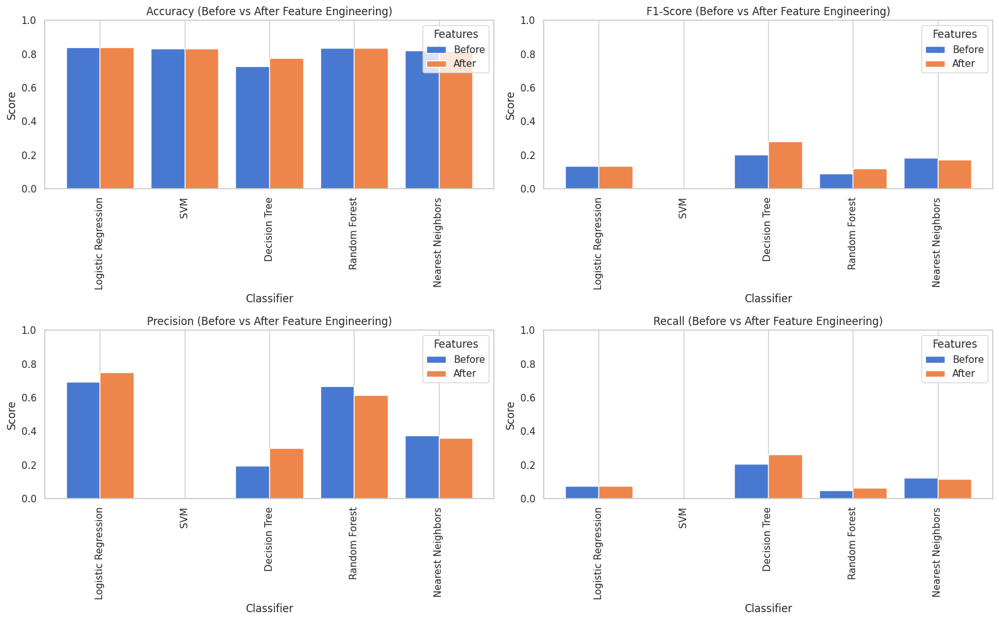

In [ ]:
# Prepare data for side-by-side bar plotting for all metrics in a single grouped bar chart per metric

# Helper to extract before/after metric DataFrame
def extract_metric_df(before_dict, after_dict, metric_name):
    before = {model: v[metric_name] for model, v in before_dict.items()}
    after = {model: v[metric_name] for model, v in after_dict.items()}
    df = pd.DataFrame({'Before': before, 'After': after})
    return df

# Extract data for each metric
df_accuracy = extract_metric_df(accuracy_score_dict, accuracy_score_dict_proposed, 'accuracy_score')
df_f1 = extract_metric_df(f1_score_dict, f1_score_dict_proposed, 'f1_score')
df_precision = extract_metric_df(precision_score_dict, precison_score_dict_proposed, 'precision_score')
df_recall = extract_metric_df(recall_score_dict, recall_score_dict_proposed, 'recall_score')

# Plot side-by-side grouped bars for each metric
fig, axes = plt.subplots(2, 2, figsize=(16, 10))

metric_dfs = {
    'Accuracy': df_accuracy,
    'F1-Score': df_f1,
    'Precision': df_precision,
    'Recall': df_recall,

}



axes_list = axes.flatten()

for ax, (title, df) in zip(axes_list, metric_dfs.items()):
    df.plot(kind='bar', ax=ax, width=0.8)
    ax.set_title(f'{title} (Before vs After Feature Engineering)')
    ax.set_ylabel('Score')
    ax.set_xlabel('Classifier')
    ax.grid(axis='y')
    ax.legend(title='Features')
    ax.set_ylim(0, 1)

plt.tight_layout()
plt.show()


**Accuracy**
- similar performances before and after feature engineering
- slightly better the Decision Tree
- Maybe caused by imbalanced target
- Accuracy is not the best metric
  - It looks at the majority class (non-CHD)

**F1-Score**
- Decision Tree shows a clear improvement

**Precision**
- Logistic regression and Decision Tree both increase in precision
- Random Forest shows an improvement in precision
  - Before feature engineering, the Decision Tree flagged many patients as at risk, but often got them wrong

**Recall**
- Decision Tree shows also here the best improvement

# Overall evaluation
The improvements are valuable:
  - especially in the context of clinical risk prediction where every correctly identified at-risk patient matters
  - Decision Tree, Logistic regression and Random Forest showed the better improvements
  - In our medical setting, even small improvements in precision matter when predicting rare conditions

Less valuable improvements:
  - Accuracy berely changed
  - SVM and KNN have a very small improvement

# Visualization of our results

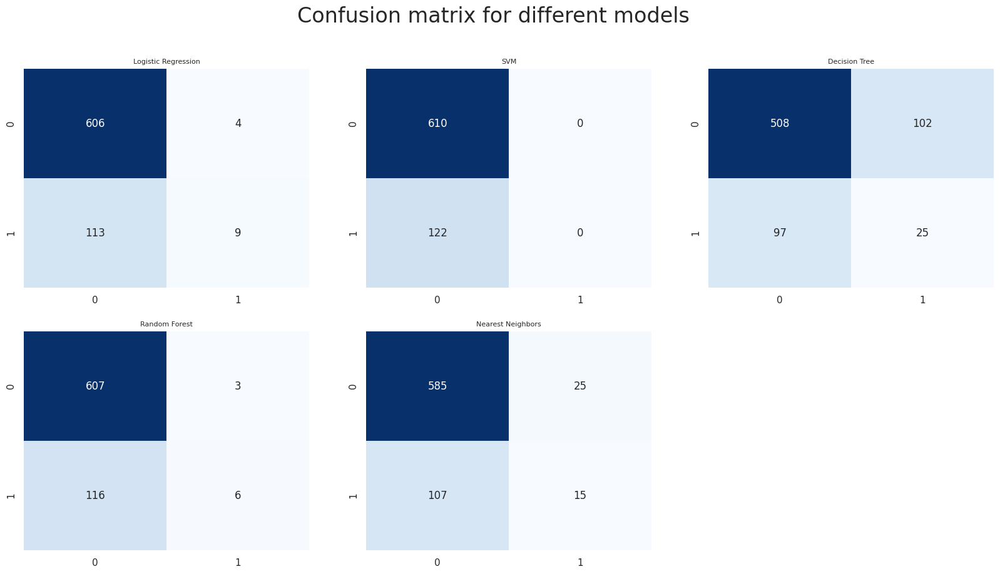

In [ ]:
plt.figure(figsize=(20,10))
plt.suptitle("Confusion matrix for different models",fontsize=24)

n = 0
for classifier, class_score in confusion_matrix_dict.items():
    for item, score in class_score.items():
        n +=1
        plt.subplot(2, 3, n)
        plt.title(classifier, fontsize=8)
        sns.heatmap(score,annot=True,cbar=False,cmap="Blues",fmt="d")



**Logistic Regression**
- very conservative: almost never raises false positives (high precision)
- recall is very poor
- Clinically unacceptable: it misses too many high-risk patients

**SVM**
- very bad: zero TP and a lot of FN
- The model predict 'no-CHD' for every patient
- SVM’s objective is to maximize the margin between classes
- But if class 1 (CHD-positive) is rare, the SVM may find it optimal to just put all examples on one side of the hyperplane
- It predicted only the majority class

**Decision Tree**
- Trades some precision for much higher recall
- This model is now showing clinical utility

**Random Forest**
- Similar behavior to Logistic Regression
  - they are both sensitive to class imbalance
- Prioritize false positive avoidance
  - cost: missing almost all positives

**Nearest Neighbors (k-NN)**
- Performs slightly better than Logistic Regression and Random Forest on recall
- Still few CHD-positive patients
- distance-based methods are moderately responsive to our engineered features



Most of our models, particularly Logistic Regression, Random Forest and SVM are better at classifying the absence of CHD (negative cases) than the presence (positive cases).
- This is expected in imbalanced datasets, where the majority class dominates and models tend to optimize for overall accuracy, often at the expense of recall for the minority class.
- However, models like Decision Tree and k-NN showed better balance, with higher true positives, suggesting they benefit more from our engineered features and are more suitable for medical screening tasks.

(0.0, 1.0)

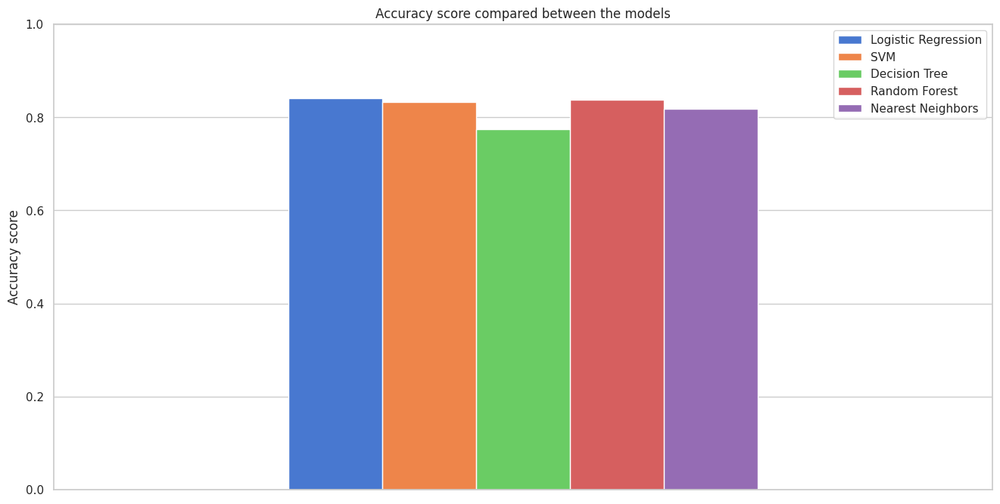

In [ ]:
ax = pd.DataFrame(accuracy_score_dict_proposed).plot(kind='bar', figsize=(16,8), title="Accuracy score compared between the models")
x_axis = ax.axes.get_xaxis()
x_axis.set_visible(False)
ax.set_ylabel("Accuracy score")
ax.set_ylim(0,1)

(0.0, 1.0)

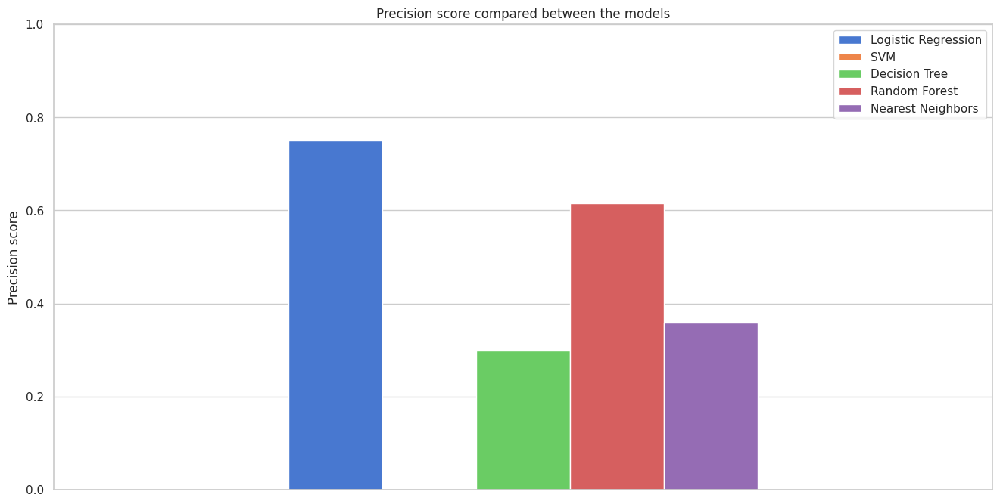

In [ ]:
ax = pd.DataFrame(precison_score_dict_proposed).plot(kind='bar', figsize=(16,8), title="Precision score compared between the models")
x_axis = ax.axes.get_xaxis()
x_axis.set_visible(False)
ax.set_ylabel("Precision score")
ax.set_ylim(0,1)

(0.0, 1.0)

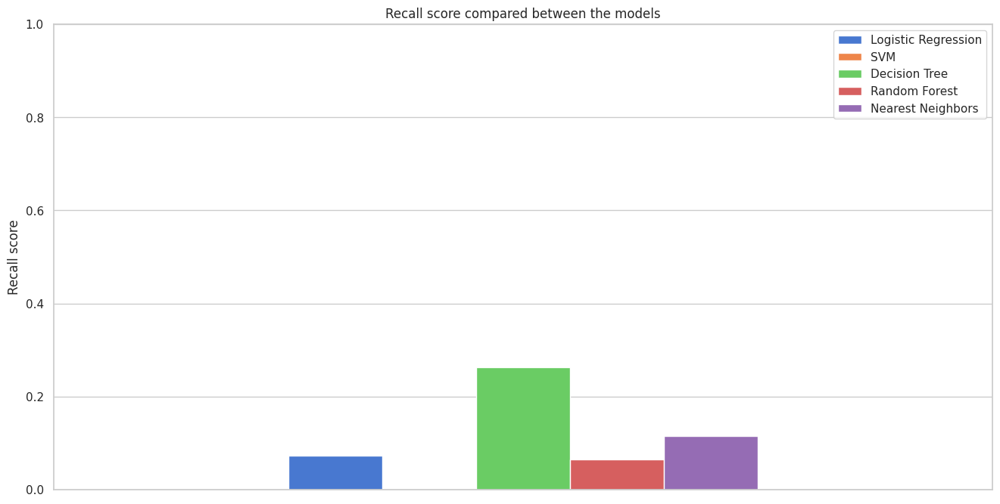

In [ ]:
ax = pd.DataFrame(recall_score_dict_proposed).plot(kind='bar', figsize=(16,8), title="Recall score compared between the models")
x_axis = ax.axes.get_xaxis()
x_axis.set_visible(False)
ax.set_ylabel("Recall score")
ax.set_ylim(0,1)

(0.0, 1.0)

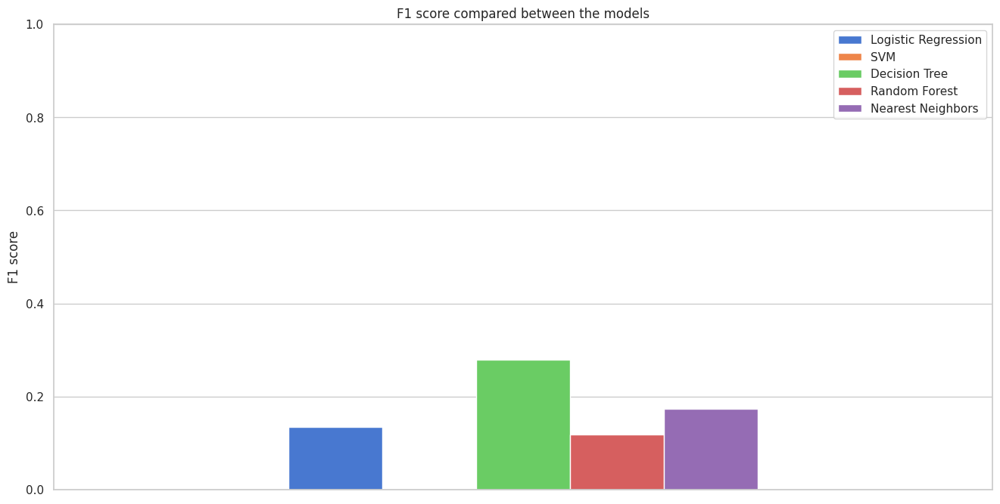

In [ ]:
ax = pd.DataFrame(f1_score_dict_proposed).plot(kind='bar', figsize=(16,8), title="F1 score compared between the models")
x_axis = ax.axes.get_xaxis()
x_axis.set_visible(False)
ax.set_ylabel("F1 score")
ax.set_ylim(0,1)

(0.0, 1.0)

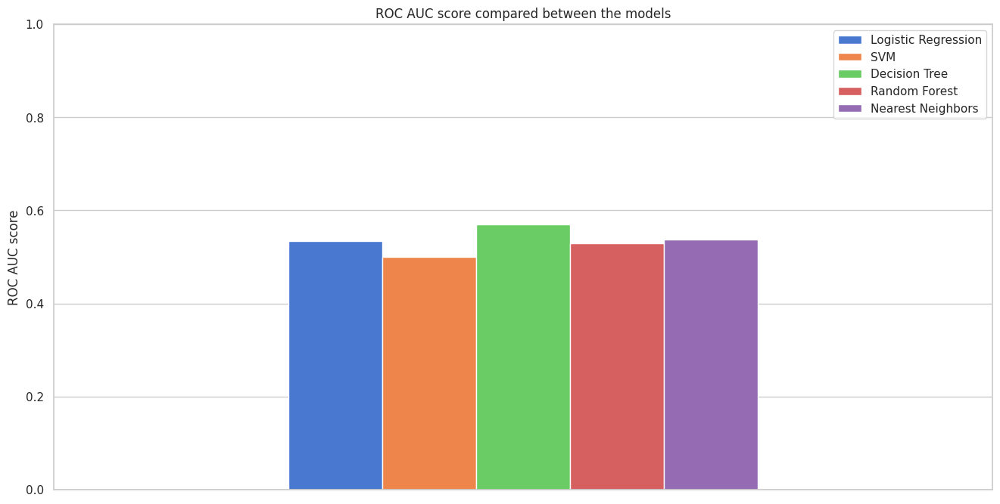

In [ ]:
ax = pd.DataFrame(roc_auc_dict_proposed).plot(kind='bar', figsize=(16,8), title="ROC AUC score compared between the models")
x_axis = ax.axes.get_xaxis()
x_axis.set_visible(False)
ax.set_ylabel("ROC AUC score")
ax.set_ylim(0,1)

**Conclusion**

Accuracy is misleading due to class imbalance (CHD is rare).

F1-Score, Precision, and especially Recall are more clinically meaningful metrics.


Decision Tree


*   Best overall performance after feature engineering.
*   Significantly improved recall, meaning it identifies more high-risk patients.
*   Trades off some precision for this, but that’s acceptable in a clinical setting.

*   Now shows true clinical utility.



| **Metric**    | **Meaning**                                                         | **Why it matters for heart disease prediction**                                      |
| ------------- | ------------------------------------------------------------------- | ------------------------------------------------------------------------------------ |
| **Accuracy**  | Proportion of total predictions that were correct                   | Can be misleading if data is imbalanced (e.g., few CHD cases)                        |
| **Precision** | TP / (TP + FP): How many predicted positives were actually correct  | High precision = fewer false alarms → less stress on the healthcare system           |
| **Recall**    | TP / (TP + FN): How many actual positives were correctly identified | critical: low recall = missed real CHD patients (false negatives) |
| **F1 Score**  | Harmonic mean of precision and recall                               | Balances false positives and false negatives, ideal for medical scenarios            |
| **ROC AUC**   | Overall ability to rank predictions  | Useful for **imbalanced datasets**. Measures how well the model separates classes across all thresholds. |

An F1 score balances precision and recall, indicating the model’s ability to correctly identify true positives while minimizing false positives.

An F1 score of 1 is perfect, while 0 means the model fails completely. Given that we did minimal fine-tuning and feature engineering, this result is a promising starting point for further development.


**Implications for Healthcare Use**


*   Missing true CHD-positive patients can lead to severe consequences, including delayed treatment or misdiagnosis.

*   Models like Logistic Regression and Random Forest, which focus on avoiding false positives, may seem statistically good but are clinically dangerous due to poor recall.

*   Decision Trees offer a more appropriate balance by catching more at-risk patients, even if they raise more false positives.

*   Decision Trees are interpretable, which helps healthcare providers understand and trust the model’s predictions.

*   In healthcare, it's safer to over-warn than under-warn.




This project stands at the intersection of data science and medical insight, using the Framingham dataset not just for raw prediction, but as a sandbox for exploring how clinical knowledge can enhance machine learning outcomes. Through feature enrichment and rigorous evaluation, we aim to contribute to both academic learning and practical health prediction methodologies.

Future Work

Feature Importance Analysis: Identify the contribution of raw vs. engineered features to model performance.

Model Interpretability: Apply SHAP or LIME to ensure clinical explainability.

Final Deployment: Package the final model with a simple front-end for educational or clinical demo use.